## Charting the Path to Sustainability: Integrating Land Sector Data with SDGs
### Land Sector Data Analysis by Country
#### Comprehensive Analysis of Geospatial Data
#### Case in Study - Austria

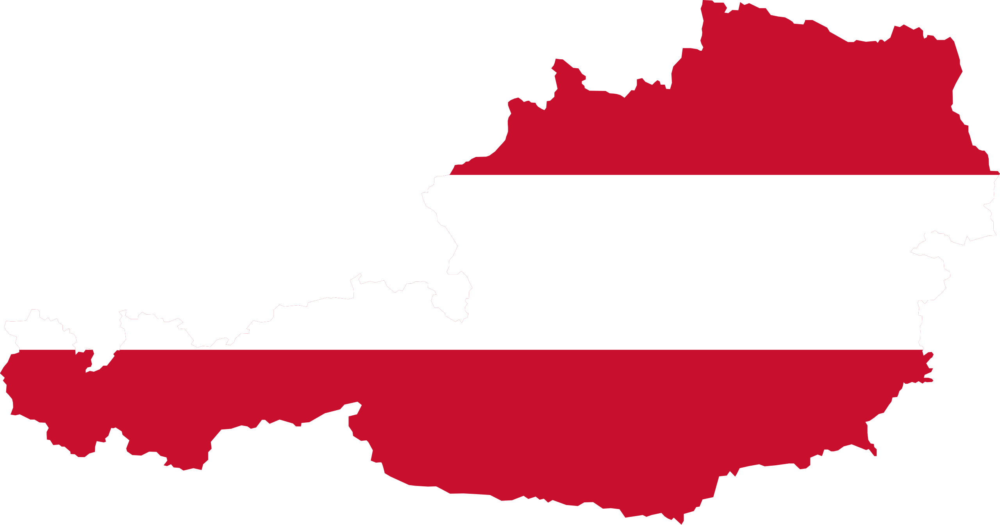

#### TABLE OF CONTENT

#### 1. INTRODUCTION
    1.0 OVERVIEW
    1.1 AIM

#### 2. REPOSITORY
    2.0 IMPORT LIBRARIES

#### 3. ADMINISTRATIVE
     3.0 BOUNDARY
       3.01 LOAD DATASET
       3.02 UNDERSTAND THE DATA
       3.03 COMPREHENSIVE ANALYSIS
     3.1 PROTECTED AREAS
       3.11 LOAD DATASET
       3.12 UNDERSTAND THE DATA
       3.13 COMPREHENSIVE ANALYSIS
     3.2 ROADS
       3.21 LOAD DATASET
       3.22 UNDERSTAND THE DATA
       3.33 COMPREHENSIVE ANALYSIS
     3.3 ADMINISTRATIVE OVERVIEW

#### 4. BIOCLIMATIC AND ECOLOGICAL ZONES
     4.0 BIODIVERSITY HOTSPOTS
       4.01 LOAD DATASET
     4.1 ECOLOGICAL ZONES
       4.11 LOAD DATASET
       4.12 UNDERSTAND THE DATA
       4.13 COMPREHENSIVE ANALYSIS
     4.2 AGROECOLOGICAL ZONES
       4.21 LOAD DATASET
       4.22 UNDERSTAND THE DATA
       4.23 COMPREHENSIVE ANALYSIS
     4.3 HOLDRIDGE LIFE ZONES
       4.31 LOAD DATASET
       4.32 UNDERSTAND THE DATA
       4.33 COMPREHENSIVE DATA
     4.4 TERRESTIAL ECOREGIONS
       4.41 LOAD DATASET
       4.42 UNDERSTAND THE DATA
       4.43 COMPREHENSIVE ANALYSIS
     4.5 BIOCLIMATIC AND ECOLOGICAL ZONES OVERVIEW
       

#### 5.SOIL RESOURCES
    5.0 SOIL RESOURCES
      5.01 LOAD DATASET
      5.02 UNDERSTAND THE DATA
      5.03 COMPREHENSIVE ANALYSIS
    5.1 SOIL RESOURCES OVERVIEW

#### 6. CLIMATE
     6.0 CLIMATE ZONES
       6.01 LOAD DATASET
       6.02 UNDERSTAND THE DATA
       6.03 COMPREHENSIVE ANALYSIS
     6.1 CLIMATE SHIFTS
       6.11 LOAD DATASETS
       6.12 UNDERSTAND THE DATA
       6.13 COMPREHENSIVE ANALYSIS
     6.2 CLIMATE ZONES OVERVIEW

#### 7. SUMMARY & RECOMMENDATION

#### 8. REFERENCES

#### 1. INTRODUCTION
    1.0 OVERVIEW

Austria, officially the Republic of Austria, is a landlocked country in Central Europe nestled within the Eastern Alps. It comprises nine federal states, with Vienna serving as both the capital and the most populous city. Austria shares its borders with Germany to the northwest, Czech Republic to the north, Slovakia to the northeast, Hungary to the east, Slovenia and Italy to the south, and Switzerland and Liechtenstein to the west. With a population of approximately 9 million, Austria boasts diverse cultural and geographical landscapes.

This project involves carrying out geospatial analysis to explore and understand the geographic context of the land sector data for Austria (AUT). The project's processes include;
- Data Preparation
- Exploratory Data Analysis
- Geospatial Analysis
- Data Interpretation

Data cleaning is unnecessary as the datasets are preprocessed and FLINT-ready.

    1.1 AIM

The aim of the this project is to apply various analytical techniques to gain insights into the spatial patterns, relationships, and characteristics of the land sector data. 

#### 2. REPOSITORY
    2.0 IMPORT LIBRARIES

Importing libraries is a critical step before loading the dataset. It is critical to import only the libraries that you are certain you will need to work with your dataset. To import to libraries, use the keyword import.

In [1]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
%matplotlib inline
import geoplot as gplt 
import geoplot.crs as gcrs 
import folium

#### 3. ADMINISTRATIVE

    3.0 BOUNDARY

    3.01 LOAD DATASET

In [2]:
# Access Aut's admin boundaries dataset from google drive using "gdown" command
!gdown "10UIriNKBL428ZoqFKitPohM_AOxVDJA3"

Downloading...
From: https://drive.google.com/uc?id=10UIriNKBL428ZoqFKitPohM_AOxVDJA3
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\AUT_AL2_Austria.json

  0%|          | 0.00/4.02M [00:00<?, ?B/s]
 13%|#3        | 524k/4.02M [00:00<00:04, 799kB/s]
 26%|##6       | 1.05M/4.02M [00:00<00:02, 1.33MB/s]
 39%|###9      | 1.57M/4.02M [00:01<00:01, 1.56MB/s]
 52%|#####2    | 2.10M/4.02M [00:01<00:00, 2.02MB/s]
 65%|######5   | 2.62M/4.02M [00:01<00:00, 2.38MB/s]
 78%|#######8  | 3.15M/4.02M [00:01<00:00, 2.51MB/s]
 91%|#########1| 3.67M/4.02M [00:01<00:00, 2.05MB/s]
100%|##########| 4.02M/4.02M [00:02<00:00, 2.00MB/s]
100%|##########| 4.02M/4.02M [00:02<00:00, 1.86MB/s]


In [3]:
# Read the shapefile into geodataframe
aut_admin = gpd.read_file("AUT_AL2_Austria.json")

In [4]:
# Check the first 2 rows of the dataframe
aut_admin.head(2)

,country,ISO3166_2,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,geometry
0,AUT,,Austria,Austria,Österreich,Republik Österreich,administrative,2,Q40,de:Österreich,2019-09-19 22:03:02,"MULTIPOLYGON (((10.45443 47.55580, 10.45403 47..."


In [5]:
# Access Aut's states boundaries dataset from google drive using "gdown" command
!gdown "11hOwrZI931Lazd3KMdHUdcr6GpJWvSR-"

Downloading...
From: https://drive.google.com/uc?id=11hOwrZI931Lazd3KMdHUdcr6GpJWvSR-
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\AUT_ALL_states.json

  0%|          | 0.00/6.94M [00:00<?, ?B/s]
  8%|7         | 524k/6.94M [00:00<00:07, 901kB/s]
 15%|#5        | 1.05M/6.94M [00:00<00:03, 1.54MB/s]
 23%|##2       | 1.57M/6.94M [00:01<00:03, 1.66MB/s]
 30%|###       | 2.10M/6.94M [00:01<00:02, 2.09MB/s]
 38%|###7      | 2.62M/6.94M [00:01<00:01, 2.17MB/s]
 45%|####5     | 3.15M/6.94M [00:01<00:01, 1.95MB/s]
 53%|#####2    | 3.67M/6.94M [00:02<00:02, 1.41MB/s]
 60%|######    | 4.19M/6.94M [00:02<00:02, 1.21MB/s]
 68%|######8   | 4.72M/6.94M [00:03<00:02, 875kB/s] 
 76%|#######5  | 5.24M/6.94M [00:04<00:01, 911kB/s]
 83%|########3 | 5.77M/6.94M [00:05<00:01, 744kB/s]
 91%|######### | 6.29M/6.94M [00:06<00:00, 660kB/s]
 98%|#########8| 6.82M/6.94M [00:06<00:00, 774kB/s]
100%|##########| 6.94M/6.94M [00:06<00:00, 1.01MB/s]

In [6]:
# Read the shapefile into geodataframe
autstates_admin = gpd.read_file("AUT_ALL_states.json")

In [7]:
# Check the first 2 rows of the dataframe
autstates_admin.head(2)

,country,ISO3166_2,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,geometry
0,AUT,AT-1,Burgenland,Burgenland,Burgenland,,administrative,4,Q43210,de:Burgenland,2019-10-29 23:56:02,"POLYGON ((16.11685 47.03232, 16.11702 47.03245..."
1,AUT,AT-2,Carinthia,Carinthia,Kärnten,,administrative,4,Q37985,de:Kärnten,2019-10-29 23:56:02,"POLYGON ((12.65591 47.09986, 12.65752 47.09898..."


    3.02 UNDERSTAND THE DATA

        COUNTRY BOUNDARY

In [8]:
# Check no.of rows and columns for Aut's admin boundary dataframme
aut_admin.shape

(1, 12)

The administrative boundary dataframe has 1 row and 12 columns.

In [9]:
# View all column titles in the dataframe
aut_admin.columns

Index(['country', 'ISO3166_2', 'name', 'enname', 'locname', 'offname',
       'boundary', 'adminlevel', 'wikidata', 'wikimedia', 'timestamp',
       'geometry'],
      dtype='object')

The above shows the names of the columns.

In [10]:
# Check the data-type of each column
aut_admin.dtypes

country               object
ISO3166_2             object
name                  object
enname                object
locname               object
offname               object
boundary              object
adminlevel             int64
wikidata              object
wikimedia             object
timestamp     datetime64[ns]
geometry            geometry
dtype: object

The above shows the data types for each column.

In [11]:
# Check information about the dataframe
aut_admin.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   country     1 non-null      object        
 1   ISO3166_2   1 non-null      object        
 2   name        1 non-null      object        
 3   enname      1 non-null      object        
 4   locname     1 non-null      object        
 5   offname     1 non-null      object        
 6   boundary    1 non-null      object        
 7   adminlevel  1 non-null      int64         
 8   wikidata    1 non-null      object        
 9   wikimedia   1 non-null      object        
 10  timestamp   1 non-null      datetime64[ns]
 11  geometry    1 non-null      geometry      
dtypes: datetime64[ns](1), geometry(1), int64(1), object(9)
memory usage: 228.0+ bytes


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, which are represented with 'int64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [12]:
# Check the coordinate system of the dataframe
aut_admin.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate system of the dataframe is 4326, which is the WGS 84 coordinate system.

In [13]:
# Check the geometric type of the dataframe
aut_admin.geom_type

0    MultiPolygon
dtype: object

The records for the dataframe has only the polygon geometric type.

       STATE BOUNDARIES

In [14]:
# Check no.of rows and columns for Aut's states boundaries dataframme
autstates_admin.shape

(9, 12)

The states boundaries dataframe has 9 rows and 12 columns.

Note: Further details regarding the boundaries of individual states within Austria are not required for the current scope of analysis.

    3.03 COMPREHENSIVE ANALYSIS

    DEFINE THE BOUNDARY

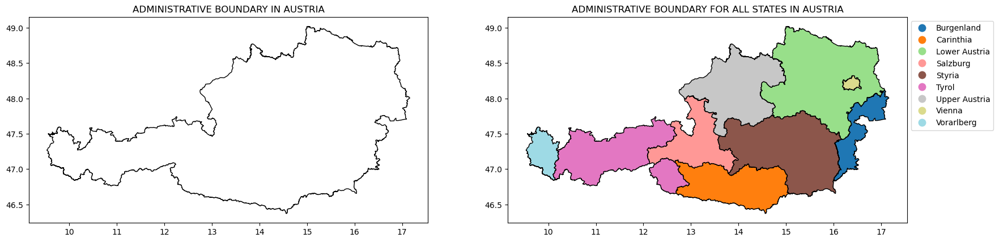

In [15]:
# Create subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Plot the administrative boundary of Austria in panel 1
aut_admin.plot(ax=ax1, color="none", edgecolor="black")
ax1.set_title("ADMINISTRATIVE BOUNDARY IN AUSTRIA")

# Plot the administrative boundaries of all states/territories in panel 2
autstates_admin.plot(ax=ax2,column="name", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("ADMINISTRATIVE BOUNDARY FOR ALL STATES IN AUSTRIA")

# Display plot
plt.show()

**Observation**

The plot above illustrates the administrative boundary of Austria, alongside the administrative boundaries of all its states.

In [16]:
# Get the total area for Austria

# Replace EPSG:4326 with a projects CRS of 32633
projected_crs = "EPSG:32633"

# Re-project geometries to a projected CRS
aut_admin = aut_admin.to_crs(projected_crs)

# Get the total area of Austria in sqm of the new CRS
total_area = aut_admin["geometry"].area.sum()

print(f"Total Area: {total_area} sqm")

Total Area: 83871072558.06047 sqm


In [17]:
# Check the for the largest state in sqm

# Re-project geometries to a projected CRS
autstates_admin = autstates_admin.to_crs(projected_crs)

# Calculate and print the area for each geometry 
autstates_admin["area"] = autstates_admin.geometry.area

In [18]:
# Convert 'timestamp_column' to strings before passing them to Folium.
autstates_admin["timestamp"] = autstates_admin["timestamp"].dt.strftime("%Y-%m-%d %H:%M:%S")

# Create an interactive map of the pronvinces in Austria showing their respective areas
autstates_admin.explore()

In [19]:
# Reproject geometries to original CRS for aut_admin
original_crs = "EPSG:4326"
aut_admin = aut_admin.to_crs(original_crs)

# Reproject geometries to original CRS for autstates_admin
autstates_admin = autstates_admin.to_crs(original_crs)

    3.1 PROTECTED AREAS

    3.11 LOAD DATASET
    

In [20]:
# Access world protected areas datasets from local computer
wdpa = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\WDPA_WDOECM_wdpa_gdb_polygons\WDPA_WDOECM_wdpa_gdb_polygons.shx")

In [21]:
# Read the shapefile into geodataframe
protected_areas = gpd.read_file(wdpa)

In [22]:
protected_areas.head(2)

,WDPAID,WDPA_PID,PA_DEF,NAME,ORIG_NAME,DESIG,DESIG_ENG,DESIG_TYPE,IUCN_CAT,INT_CRIT,...,MANG_AUTH,MANG_PLAN,VERIF,METADATAID,SUB_LOC,PARENT_ISO,ISO3,SUPP_INFO,CONS_OBJ,geometry
0,10715.0,10715,1,Kronotskiy,Kronotskiy,UNESCO-MAB Biosphere Reserve,UNESCO-MAB Biosphere Reserve,International,Not Applicable,Not Applicable,...,Not Reported,Not Reported,State Verified,840,RU-KAM,RUS,RUS,Not Applicable,Not Applicable,"MULTIPOLYGON (((160.49655 55.17709, 160.49907 ..."
1,209777.0,209777_E,1,Sarali Land between Rivers / Great Volzhsko-Ka...,Great Volzhsko-Kamsky,UNESCO-MAB Biosphere Reserve,UNESCO-MAB Biosphere Reserve,International,Not Applicable,Not Applicable,...,Not Reported,Not Reported,State Verified,840,RU-TA,RUS,RUS,Not Applicable,Not Applicable,"POLYGON ((49.30487 55.36806, 49.30433 55.37184..."


In [23]:
# Filter data for Austria's
aut_protected_areas = protected_areas[protected_areas["PARENT_ISO"] == "AUT"]

In [24]:
aut_protected_areas.head(2)

,WDPAID,WDPA_PID,PA_DEF,NAME,ORIG_NAME,DESIG,DESIG_ENG,DESIG_TYPE,IUCN_CAT,INT_CRIT,...,MANG_AUTH,MANG_PLAN,VERIF,METADATAID,SUB_LOC,PARENT_ISO,ISO3,SUPP_INFO,CONS_OBJ,geometry
5253,67803.0,67803,1,Untere Lobau,Untere Lobau,"Ramsar Site, Wetland of International Importance","Ramsar Site, Wetland of International Importance",International,Not Reported,(i)(ii)(iii)(iv),...,Not Reported,Management plan is implented and available,State Verified,1856,AT-9,AUT,AUT,Not Applicable,Not Applicable,"POLYGON ((16.51870 48.18641, 16.51762 48.18575..."
5878,555558377.0,555558377,1,Güssing Fishponds,Güssing Fishponds,"Ramsar Site, Wetland of International Importance","Ramsar Site, Wetland of International Importance",International,Not Reported,(ii)(iii)(iv),...,Not Reported,https://rsis.ramsar.org/ris/2137,State Verified,1856,Not Reported,AUT,AUT,Not Applicable,Not Applicable,"MULTIPOLYGON (((17.24417 46.98159, 17.24388 46..."


    3.12 UNDERSTAND THE DATA

In [25]:
# Check no.of rows and columns for world protected areas dataframe
protected_areas.shape

(240165, 31)

The world protected areas dataframe has 240165 rows and 31 columns.

In [26]:
# Check no.of rows and columns for Aut's protected areas dataframe
aut_protected_areas.shape

(1643, 31)

Armenia's protected areas dataframe has 36 rows and 31 columns.

In [27]:
# Check for unique value and their counts in the selected column
aut_protected_areas["DESIG"].value_counts()

Naturschutzgebiet                                    477
Geschützter Landschaftsteil                          327
Site of Community Importance (Habitats Directive)    305
Landschaftsschutzgebiet                              270
Special Protection Area (Birds Directive)            100
Naturpark                                             49
Nationalpark                                          26
Geschützte Naturgebilde Von Örtlicher Bedeutung       18
Ramsar Site, Wetland of International Importance      15
Biosphärenpark                                        11
Örtliche Schutzgebiete                                 9
Ruhegebiet                                             9
Sonderschutzgebiete                                    8
Pflanzenschutzgebiet                                   5
Landschafts- Und Naturschutzgebiet                     4
Ökologische Entwicklungsfläche                         3
Geschützte Biotope                                     3
Geschützter Lebensraum         

This shows the unique values and respective counts in the "Desig" column.

In [28]:
# View all column titles in the dataframe
aut_protected_areas.columns

Index(['WDPAID', 'WDPA_PID', 'PA_DEF', 'NAME', 'ORIG_NAME', 'DESIG',
       'DESIG_ENG', 'DESIG_TYPE', 'IUCN_CAT', 'INT_CRIT', 'MARINE',
       'REP_M_AREA', 'GIS_M_AREA', 'REP_AREA', 'GIS_AREA', 'NO_TAKE',
       'NO_TK_AREA', 'STATUS', 'STATUS_YR', 'GOV_TYPE', 'OWN_TYPE',
       'MANG_AUTH', 'MANG_PLAN', 'VERIF', 'METADATAID', 'SUB_LOC',
       'PARENT_ISO', 'ISO3', 'SUPP_INFO', 'CONS_OBJ', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [29]:
# Check the data-type of each column
aut_protected_areas.dtypes

WDPAID         float64
WDPA_PID        object
PA_DEF          object
NAME            object
ORIG_NAME       object
DESIG           object
DESIG_ENG       object
DESIG_TYPE      object
IUCN_CAT        object
INT_CRIT        object
MARINE          object
REP_M_AREA     float64
GIS_M_AREA     float64
REP_AREA       float64
GIS_AREA       float64
NO_TAKE         object
NO_TK_AREA     float64
STATUS          object
STATUS_YR        int64
GOV_TYPE        object
OWN_TYPE        object
MANG_AUTH       object
MANG_PLAN       object
VERIF           object
METADATAID       int64
SUB_LOC         object
PARENT_ISO      object
ISO3            object
SUPP_INFO       object
CONS_OBJ        object
geometry      geometry
dtype: object

The above shows the data types for each column.

In [30]:
# Check information about the dataframe
aut_protected_areas.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1643 entries, 5253 to 78151
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   WDPAID      1643 non-null   float64 
 1   WDPA_PID    1643 non-null   object  
 2   PA_DEF      1643 non-null   object  
 3   NAME        1643 non-null   object  
 4   ORIG_NAME   1643 non-null   object  
 5   DESIG       1643 non-null   object  
 6   DESIG_ENG   1643 non-null   object  
 7   DESIG_TYPE  1643 non-null   object  
 8   IUCN_CAT    1643 non-null   object  
 9   INT_CRIT    1643 non-null   object  
 10  MARINE      1643 non-null   object  
 11  REP_M_AREA  1643 non-null   float64 
 12  GIS_M_AREA  1643 non-null   float64 
 13  REP_AREA    1643 non-null   float64 
 14  GIS_AREA    1643 non-null   float64 
 15  NO_TAKE     1643 non-null   object  
 16  NO_TK_AREA  1643 non-null   float64 
 17  STATUS      1643 non-null   object  
 18  STATUS_YR   1643 non-null   int64   

This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, which are represented with 'int64' and 'float64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [31]:
# Check the coordinate system of the dataframe
aut_protected_areas.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate system of the dataframe is 4326, which is the WGS 84 coordinate system.

In [32]:
# Check the geometric type of the dataframe
aut_protected_areas.geom_type

5253          Polygon
5878     MultiPolygon
5879     MultiPolygon
5885     MultiPolygon
5886     MultiPolygon
             ...     
78147         Polygon
78148         Polygon
78149    MultiPolygon
78150    MultiPolygon
78151         Polygon
Length: 1643, dtype: object

The dataframe has records for both multipolygon and polygon geometric type.

    3.13 COMPREHENSIVE ANALYSIS

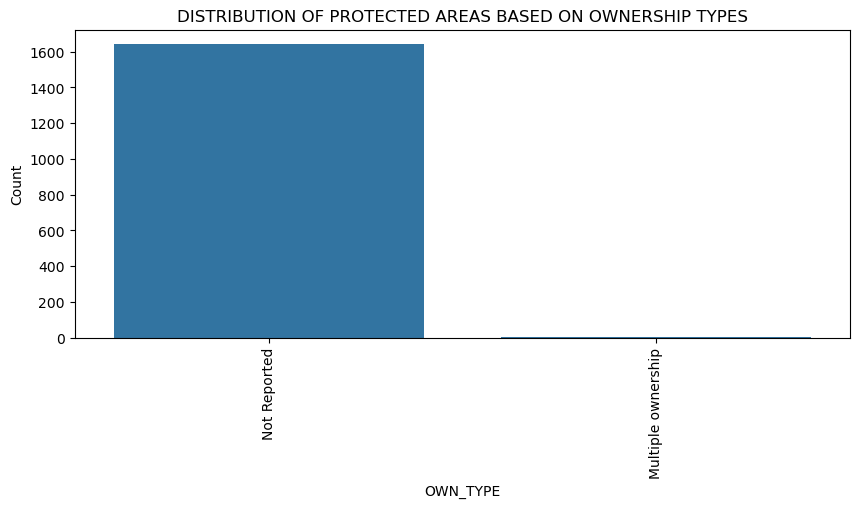

In [33]:
# Check distribution of ownership type of protected areas
plt.figure(figsize=(10, 4))
sns.countplot(x="OWN_TYPE",
              data=aut_protected_areas,
              order=aut_protected_areas["OWN_TYPE"].value_counts().index,
              color="#1f77b4")
plt.xticks(rotation=90)
plt.title("DISTRIBUTION OF PROTECTED AREAS BASED ON OWNERSHIP TYPES")
plt.xlabel("OWN_TYPE")
plt.ylabel("Count")

# Display plot
plt.show()

**Observation**

The majority of Austria's protected areas lack reported ownership structures, with only a small fraction being under multiple ownership.

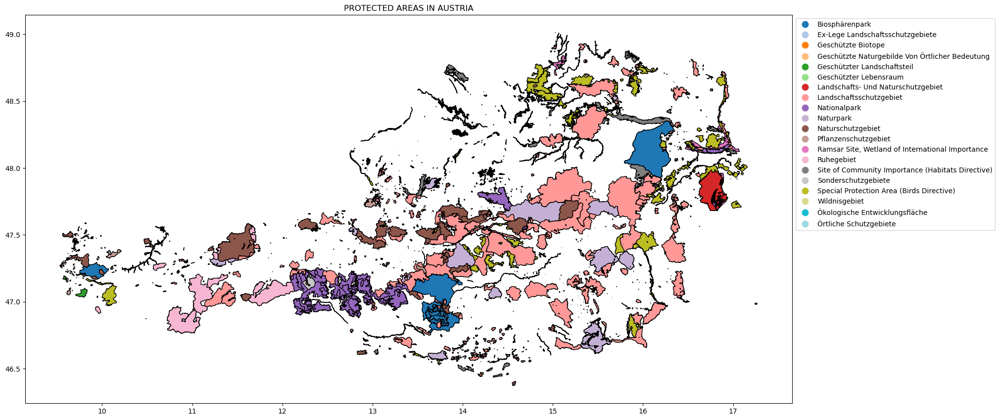

In [34]:
# Create plot
fig, ax = plt.subplots(figsize=(20, 15))

# Plot the protected areas
aut_protected_areas.plot(ax=ax, cmap="tab20", column="DESIG", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("PROTECTED AREAS IN AUSTRIA")

# Display plot
plt.show()

**Observation**

The map illustrates the distribution of 20 distinct protected areas in Austria. Notably, the Naturschutzgebiet emerges as the most prevalent protected area, with a total of 477 occurrences throughout the country.

    3.2 ROADS

    3.21 LOAD DATASETS

In [35]:
# Access global roads dataset from local computer
globalroads = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\Global Roads Open Access Data Set_dissolved.json")

In [36]:
# Read the json into geodataframe
open_globalroads = gpd.read_file(globalroads)

In [37]:
open_globalroads.head(2)

,OBJECTID,ONME,FCLASS,SRFTPE,ISSEASONAL,CURNTPRAC,GDWTHRPRAC,SUM_LENGTH_KM,geometry
0,1,NaN,0,0.0,0.0,NaN,NaN,16686.65607,"LINESTRING (-66.82451 17.98029, -66.82455 17.9..."
1,2,NaN,0,0.0,0.0,NaN,NaN,16686.65607,"LINESTRING (-66.62012 17.98131, -66.62126 17.9..."


In [38]:
# Extract information for Aut roads only
# Overlay to get roads within Aut's boundaries
aut_roads = gpd.overlay(open_globalroads, aut_admin, how="intersection")

# Display the information for Arm
aut_roads.head(2)

,OBJECTID,ONME,FCLASS,SRFTPE,ISSEASONAL,CURNTPRAC,GDWTHRPRAC,SUM_LENGTH_KM,country,ISO3166_2,name,enname,locname,offname,boundary,adminlevel,wikidata,wikimedia,timestamp,geometry
0,593134,,0,0.0,0.0,0.0,0.0,6.113355e+06,AUT,,Austria,Austria,Österreich,Republik Österreich,administrative,2,Q40,de:Österreich,2019-09-19 22:03:02,"LINESTRING (14.26099 46.43920, 14.26167 46.444..."
1,593719,,0,0.0,0.0,0.0,0.0,6.113355e+06,AUT,,Austria,Austria,Österreich,Republik Österreich,administrative,2,Q40,de:Österreich,2019-09-19 22:03:02,"LINESTRING (12.94105 46.60516, 12.94335 46.618..."


    3.22 UNDERSTAND THE DATA

In [39]:
# Check no.of rows and columns for global roads dataframe
open_globalroads.shape

(1101300, 9)

The global roads dataframe has 1101300 rows and 9 columns.

In [40]:
# Check no.of rows and columns for Aut's roads dataframe
aut_roads.shape

(606, 20)

The Aut roads dataframe has 606 rows and 20 columns. The increase in the number of columns is attributed to the overlay performed within Austria's boundaries.

In [41]:
# Check for unique value and their counts in the selected column
aut_roads["FCLASS"].value_counts()

0    516
5     90
Name: FCLASS, dtype: int64

This shows the unique values and respective counts in the "FCLASS" column.

In [42]:
# View all column titles in the dataframe
aut_roads.columns

Index(['OBJECTID', 'ONME', 'FCLASS', 'SRFTPE', 'ISSEASONAL', 'CURNTPRAC',
       'GDWTHRPRAC', 'SUM_LENGTH_KM', 'country', 'ISO3166_2', 'name', 'enname',
       'locname', 'offname', 'boundary', 'adminlevel', 'wikidata', 'wikimedia',
       'timestamp', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [43]:
# Check the data-type of each column
aut_roads.dtypes

OBJECTID                  int64
ONME                     object
FCLASS                    int64
SRFTPE                  float64
ISSEASONAL              float64
CURNTPRAC               float64
GDWTHRPRAC              float64
SUM_LENGTH_KM           float64
country                  object
ISO3166_2                object
name                     object
enname                   object
locname                  object
offname                  object
boundary                 object
adminlevel                int64
wikidata                 object
wikimedia                object
timestamp        datetime64[ns]
geometry               geometry
dtype: object

The above shows the data types for each column.

In [44]:
# Check information about the dataframe
aut_roads.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 606 entries, 0 to 605
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   OBJECTID       606 non-null    int64         
 1   ONME           606 non-null    object        
 2   FCLASS         606 non-null    int64         
 3   SRFTPE         606 non-null    float64       
 4   ISSEASONAL     606 non-null    float64       
 5   CURNTPRAC      606 non-null    float64       
 6   GDWTHRPRAC     606 non-null    float64       
 7   SUM_LENGTH_KM  606 non-null    float64       
 8   country        606 non-null    object        
 9   ISO3166_2      606 non-null    object        
 10  name           606 non-null    object        
 11  enname         606 non-null    object        
 12  locname        606 non-null    object        
 13  offname        606 non-null    object        
 14  boundary       606 non-null    object        
 15  adminlevel     

This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, which are represented with 'int64' and 'float64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [45]:
# Check the coordinate system of the dataframe
aut_roads.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate system of the dataframe is 4326, which is the WGS 84 coordinate system.

In [46]:
# Check the geometric type of the dataframe
aut_roads.geom_type

0      LineString
1      LineString
2      LineString
3      LineString
4      LineString
          ...    
601    LineString
602    LineString
603    LineString
604    LineString
605    LineString
Length: 606, dtype: object

The records for the dataframe has the linestring geometric type.

     3.23 COMPREHENSIVE ANALYSIS

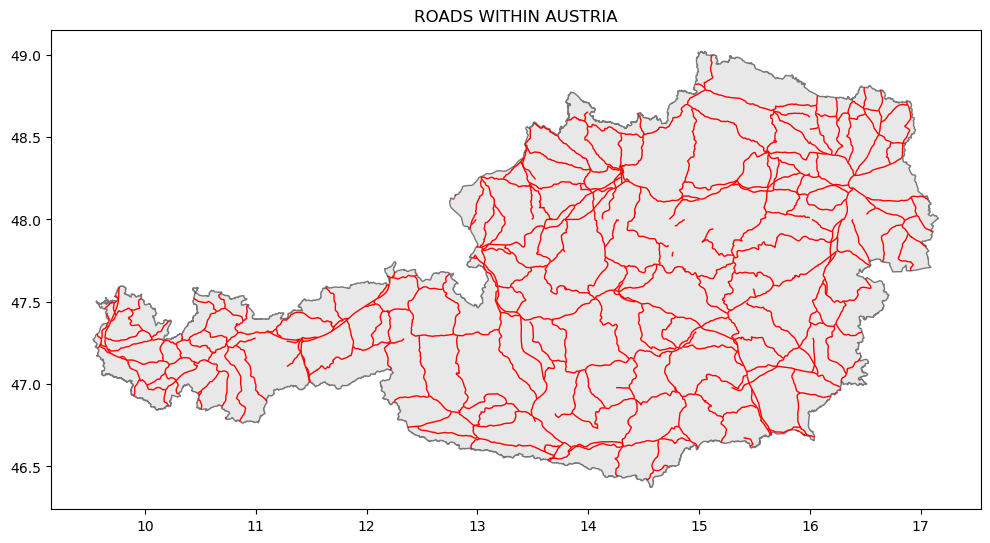

In [47]:
# Plot Austria's boundaries and the roads
fig, ax = plt.subplots(figsize=(12, 8))

# Plot Austria's boundaries
aut_admin.plot(ax=ax, color="lightgray", edgecolor="black", alpha=0.5)

# Plot roads within Austria
aut_roads.plot(ax=ax, color="red", linewidth=1)

plt.title("ROADS WITHIN AUSTRIA")
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_23112\1319994846.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap("rainbow", len(road_categories))


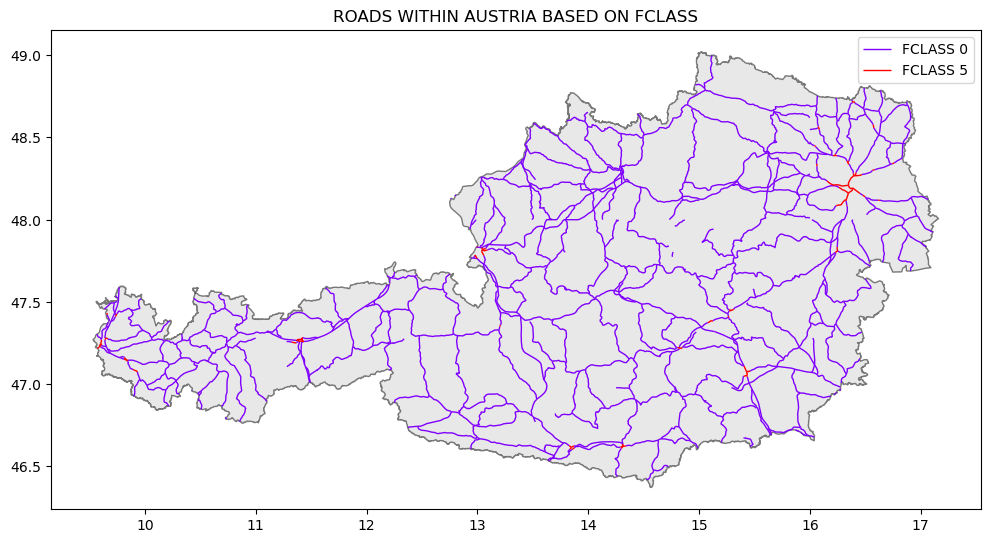

In [48]:
# Plot Austria's boundaries
fig, ax = plt.subplots(figsize=(12, 8))
aut_admin.plot(ax=ax, color="lightgray", edgecolor="black", alpha=0.5)

# Categorize roads based on FCLASS
road_categories = aut_roads["FCLASS"].unique()
colors = plt.cm.get_cmap("rainbow", len(road_categories))

# Plot roads based on FCLASS
for i, category in enumerate(road_categories):
    roads_subset = aut_roads[aut_roads["FCLASS"] == category]
    roads_subset.plot(ax=ax, color=colors(i), linewidth=1, label=f'FCLASS {category}')

plt.title("ROADS WITHIN AUSTRIA BASED ON FCLASS")
plt.legend()

# Dsplay plot
plt.show()

**Observation**

The observation highlights the road network infrastructure in Austria, revealing that roads classified as FCLASS 0 are the most prevalent, while those classified as FCLASS 5 are notably scarce. This distribution pattern suggests a significant presence of unspecified roads, indicating areas where road designations may require further clarification or documentation.

     3.3 ADMINISTRATIVE OVERVIEW 

**Overview**

Austria, with an area spanning approximately 83 billion square meters, comprises 9 states, with Lower Austria being the largest in terms of size. However, there are notable data quality issues regarding the ownership structure of protected areas, as majority of the protected areas are categorized as not-reported, indicating a lack of specific ownership data and a few others belong to multiple ownsership.  Despite this, Austria boasts a total of 1643 protected areas across 20 distinct categories, with Naturschutzgebiet being the most prevalent, totaling 477 occurrences nationwide.

The road network in Austria is primarily composed of unspecified roads (FCLASS 0), with limited representation of local/urban roads (FCLASS 5). This distribution underscores the need for further clarification and documentation of road designations to enhance transportation planning and infrastructure development.

#### 4. BIOCLIMATIC AND ECOLOGICAL ZONES

    4.0 BIODIVERSITY HOTSPOTS

    4.01 LOAD DATASET

In [49]:
# Access global biodiversity hotspots from local computer
global_biodivhotspots= (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\CI_BiodiversityHotspots (1).geojson")

In [50]:
# Read the json into geodataframe
biodiv_hotspots = gpd.read_file(global_biodivhotspots)

In [51]:
biodiv_hotspots.head(2)

,OBJECTID,NAME,Type,Shape_Length,Shape_Area,geometry
0,1,Chilean Winter Rainfall and Valdivian Forests,hotspot area,200.706891,40.754665,"MULTIPOLYGON (((-74.59792 -46.92502, -74.61111..."
1,2,Chilean Winter Rainfall and Valdivian Forests,outer limit,191.174978,186.085694,"POLYGON ((-70.30946 -22.96028, -70.48596 -22.7..."


In [52]:
# Extract information for Aut biodiversity hotspots
aut_biohotspots = biodiv_hotspots.clip(aut_admin)
aut_biohotspots = aut_biohotspots.reset_index(drop=True)

In [53]:
aut_biohotspots.head(2)

,OBJECTID,NAME,Type,Shape_Length,Shape_Area,geometry


There is no data recorded for the biodiversity hotspots in Austria.

    4.1 ECOLOGICAL ZONES

    4.11 LOAD DATASET

In [54]:
# Access Austria's ecological dataset from google drive using "gdown" command
!gdown "14oUNyjoiK2EM7VZeYMuiipLaq8htXOKd"

Downloading...
From: https://drive.google.com/uc?id=14oUNyjoiK2EM7VZeYMuiipLaq8htXOKd
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\AUT_AL2_Austria_GEZ.json

  0%|          | 0.00/4.71M [00:00<?, ?B/s]
 11%|#1        | 524k/4.71M [00:00<00:06, 686kB/s]
 22%|##2       | 1.05M/4.71M [00:01<00:03, 1.01MB/s]
 33%|###3      | 1.57M/4.71M [00:01<00:02, 1.22MB/s]
 45%|####4     | 2.10M/4.71M [00:01<00:01, 1.46MB/s]
 56%|#####5    | 2.62M/4.71M [00:02<00:01, 1.45MB/s]
 67%|######6   | 3.15M/4.71M [00:02<00:00, 1.62MB/s]
 78%|#######7  | 3.67M/4.71M [00:02<00:00, 1.71MB/s]
 89%|########9 | 4.19M/4.71M [00:02<00:00, 1.72MB/s]
100%|##########| 4.71M/4.71M [00:03<00:00, 2.00MB/s]
100%|##########| 4.71M/4.71M [00:03<00:00, 1.55MB/s]


In [55]:
# Read geojson file into a geodataframe
aut_gez = gpd.read_file("AUT_AL2_Austria_GEZ.json")

In [56]:
aut_gez.head(2)

,country,ISO3166_2,name,gez_name,gez_code,gez_abbrev,adminlevel,geometry
0,AUT,,Austria,Temperate continental forest,32,TeDc,2,"MULTIPOLYGON (((15.50540 48.92595, 15.50532 48..."
1,AUT,,Austria,Temperate mountain system,35,TeM,2,"MULTIPOLYGON (((15.42431 46.65117, 15.42327 46..."


In [57]:
# Access Austria's states ecological dataset from google drive using "gdown" command
!gdown "1YPYhAskNv0VO1R3wKzAcXXfZAQ3lXiVM"

Downloading...
From: https://drive.google.com/uc?id=1YPYhAskNv0VO1R3wKzAcXXfZAQ3lXiVM
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\AUT_ALL_states_GEZ.json

  0%|          | 0.00/8.22M [00:00<?, ?B/s]
  6%|6         | 524k/8.22M [00:00<00:13, 562kB/s]
 13%|#2        | 1.05M/8.22M [00:01<00:09, 750kB/s]
 19%|#9        | 1.57M/8.22M [00:01<00:07, 916kB/s]
 26%|##5       | 2.10M/8.22M [00:02<00:06, 893kB/s]
 32%|###1      | 2.62M/8.22M [00:02<00:05, 972kB/s]
 38%|###8      | 3.15M/8.22M [00:03<00:04, 1.10MB/s]
 45%|####4     | 3.67M/8.22M [00:03<00:03, 1.14MB/s]
 51%|#####1    | 4.19M/8.22M [00:04<00:03, 1.19MB/s]
 57%|#####7    | 4.72M/8.22M [00:04<00:03, 1.03MB/s]
 64%|######3   | 5.24M/8.22M [00:05<00:02, 1.16MB/s]
 70%|#######   | 5.77M/8.22M [00:05<00:02, 1.21MB/s]
 77%|#######6  | 6.29M/8.22M [00:06<00:01, 1.11MB/s]
 83%|########2 | 6.82M/8.22M [00:06<00:01, 1.24MB/s]
 89%|########9 | 7.34M/8.22M [00:07<00:00, 1.02M

In [58]:
# Read geojson file into a geodataframe
autstates_gez = gpd.read_file("AUT_ALL_states_GEZ.json")

In [59]:
autstates_gez.head(2)

,country,ISO3166_2,name,gez_name,gez_code,gez_abbrev,adminlevel,geometry
0,AUT,AT-1,Burgenland,Temperate continental forest,32,TeDc,4,"POLYGON ((16.27611 46.98111, 16.27608 46.98267..."
1,AUT,AT-3,Lower Austria,Temperate continental forest,32,TeDc,4,"MULTIPOLYGON (((15.03835 49.01205, 15.03828 49..."


    4.12 UNDERSTAND THE DATA

        COUNTRY ECOLOGICAL ZONES

In [60]:
# Check for unique value and their counts in the selected column
aut_gez["gez_name"].value_counts()

Temperate continental forest    1
Temperate mountain system       1
Temperate oceanic forest        1
Name: gez_name, dtype: int64

In [61]:
# Check no.of rows and columns for Aut's ecological zones
aut_gez.shape

(3, 8)

Aut's ecological dataframe has 3 rows and 8 columns.

In [62]:
# View all column titles in the dataframe
aut_gez.columns

Index(['country', 'ISO3166_2', 'name', 'gez_name', 'gez_code', 'gez_abbrev',
       'adminlevel', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [63]:
# Check information about the dataframe
aut_gez.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   country     3 non-null      object  
 1   ISO3166_2   3 non-null      object  
 2   name        3 non-null      object  
 3   gez_name    3 non-null      object  
 4   gez_code    3 non-null      int64   
 5   gez_abbrev  3 non-null      object  
 6   adminlevel  3 non-null      int64   
 7   geometry    3 non-null      geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 324.0+ bytes


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, which are represented with 'int64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [64]:
# Check the coordinate system of the dataframe
aut_gez.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate system of the dataframe is 4326, which is the WGS 84 coordinate system.

In [65]:
# Check the geometric type of the dataframe
aut_gez.geom_type

0    MultiPolygon
1    MultiPolygon
2    MultiPolygon
dtype: object

The records for the dataframe has both the multipolygon geometric type.

       ALL STATES ECOLOGICAL ZONES

In [66]:
autstates_gez["gez_name"].value_counts()

Temperate mountain system       8
Temperate oceanic forest        7
Temperate continental forest    4
Name: gez_name, dtype: int64

This analysis shows the unique values and respective counts in the "gez_name" column on state levels for Austria.

Note: Further analyses on states ecological zones is deemed unnecessary to avoid redundancy.

    4.13 COMPREHENSIVE ANALYSIS

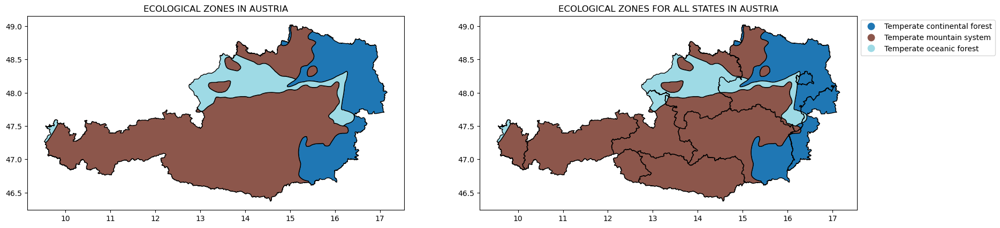

In [67]:
# Create subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 15))

# Plot the ecological zones of Austria in panel 1
aut_gez.plot(ax=ax1, cmap="tab20", column="gez_name", edgecolor="black")
ax1.set_title("ECOLOGICAL ZONES IN AUSTRIA")

# Plot the ecological zones of all states in panel 2
autstates_gez.plot(ax=ax2,column="gez_name", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("ECOLOGICAL ZONES FOR ALL STATES IN AUSTRIA")

# Display plot
plt.show()

**Observation**

Austria's ecological landscape reveals the Temperate mountain system as its largest ecological zone, spanning across a large number of states within the country. Interestingly, certain states exhibit a combination of two to three distinct ecological zones, adding to the complexity of Austria's environmental makeup.

    4.2 AGROECOLOGICAL ZONES

In [68]:
# Access global agroecological zones from local computer
global_aeczones= (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\GlobalAgroEcologicalZones_GAEZ.geojson")

In [69]:
# Read geojson file into a geodataframe
aeczones = gpd.read_file(global_aeczones)

In [70]:
aeczones.head(2)

,Value,geometry
0,1,"POLYGON ((-33.50000 83.65000, -33.50000 83.500..."
1,1,"POLYGON ((-37.85000 83.60000, -37.85000 83.500..."


    4.21 UNDERSTAND THE DATA

In [71]:
# Check no.of rows and columns for global ecological zones
aeczones.shape

(116675, 2)

The dataframe has 116675 rows and 2 columns

In [72]:
# Check for unique values present in the value column
aeczones["Value"].unique()

array([ 1,  2, 18, 14, 11, 12, 13,  5, 10,  9, 17,  8, 16, 15,  4,  6,  7,
        3], dtype=int64)

This shows the unique values and respective counts in the "Value" column.

In [73]:
# Fix the data and replace numbers with acgroecological zones

values = {"1": "Tropical-Arid", "2": "Tropical-Dry Semi-Arid", "3": "Tropical -Moist Semi-Arid", "4": "Tropical-Sub-Humid", "5": "Tropical-Humid", 
          "6": "Tropical-Humid (year round)", "7": "Temperate-Arid", "8": "Temperate-Dry Semi-Arid", "9": "Temperate-Moist Semi-Arid", 
          "10": "Temperate-Sub-Humid", "11": "Temperate-Humid", "12": "Temperate-Humid (year round)", "13": "Boreal-Arid", 
          "14": "Boreal-Dry Semi-Arid", "15": "Boreal-Moist Semi-Arid", "16": "Boreal-Sub-humid", "17": "Boreal-Humid", 
          "18": "Boreal-Humid (year round)"}

In [74]:
# Standardize the column names
aeczones.columns = aeczones.columns.str.lower()

In [75]:
# Rename class name
aeczones.value = aeczones.value.astype("str").replace(values)

In [76]:
# Check to see replaced values
aeczones.head(2)

,value,geometry
0,Tropical-Arid,"POLYGON ((-33.50000 83.65000, -33.50000 83.500..."
1,Tropical-Arid,"POLYGON ((-37.85000 83.60000, -37.85000 83.500..."


In [77]:
# Extract Austria's agroecological zones
aut_aeczones = aeczones.clip(aut_admin)
aut_aeczones = aut_aeczones.reset_index(drop=True)

In [78]:
aut_aeczones.head(2)

,value,geometry
0,Tropical-Arid,"MULTIPOLYGON (((13.40000 47.85000, 13.55000 47..."
1,Boreal-Arid,"POLYGON ((15.75000 46.75000, 15.98670 46.75000..."


In [79]:
aut_aeczones.shape

(118, 2)

The dataframe has 118 rows and 2 columns

In [80]:
# View all column titles in the dataframe
aut_aeczones.columns

Index(['value', 'geometry'], dtype='object')

The above shows the names of the columns.

In [81]:
# Check for unique value and their counts in the selected column
aut_aeczones["value"].value_counts()

Boreal-Humid                    30
Boreal-Sub-humid                23
Boreal-Arid                     17
Temperate-Sub-Humid              9
Boreal-Dry Semi-Arid             8
Tropical-Arid                    7
Boreal-Moist Semi-Arid           6
Temperate-Humid (year round)     5
Temperate-Humid                  5
Temperate-Moist Semi-Arid        2
Boreal-Humid (year round)        2
Tropical-Humid                   2
Tropical-Sub-Humid               2
Name: value, dtype: int64

This shows the unique values and respective counts in the "value" column.

In [82]:
# Check the data-type of each column
aut_aeczones.dtypes

value         object
geometry    geometry
dtype: object

The above shows the data types for each column.

In [83]:
# Check information about the dataframe
aut_aeczones.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   value     118 non-null    object  
 1   geometry  118 non-null    geometry
dtypes: geometry(1), object(1)
memory usage: 2.0+ KB


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [84]:
# Check the coordinate system of the dataframe
aut_aeczones.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [85]:
# Check the geometric type of the dataframe
aut_aeczones.geom_type

0      MultiPolygon
1           Polygon
2      MultiPolygon
3      MultiPolygon
4           Polygon
           ...     
113         Polygon
114         Polygon
115    MultiPolygon
116         Polygon
117    MultiPolygon
Length: 118, dtype: object

The records for the dataframe have the polygon and mutlipolgon geometric type.

    4.22 COMPREHENSIVE ANALYSIS

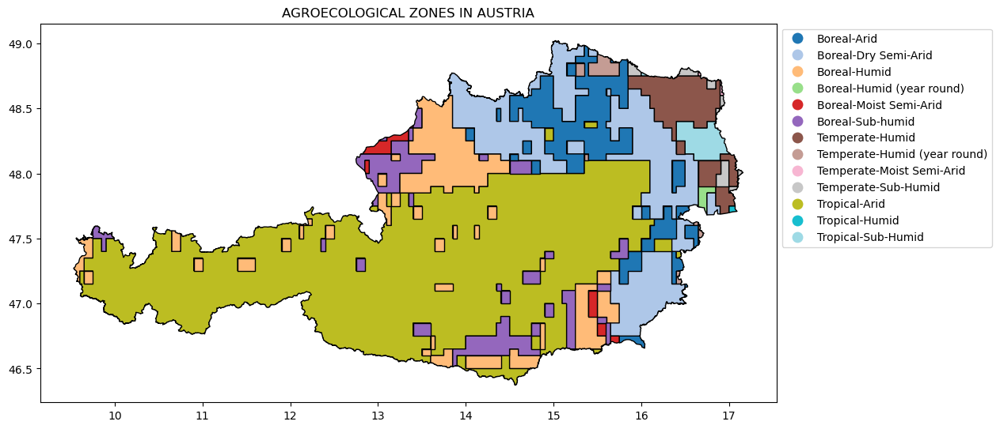

In [86]:
# Create plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the agroecological zones
aut_aeczones.plot(ax=ax, cmap="tab20", column="value", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("AGROECOLOGICAL ZONES IN AUSTRIA")

# Display plot
plt.show()

**Observation**

In Austria, the Tropical-Arid agroecological zone exhibits a larger geographical coverage, despite its lower frequency compared to the Boreal-Humid zone. This disparity suggests that the distribution and extent of agroecological zones in Austria are influenced by factors beyond just their frequency. It implies varying environmental conditions and land use patterns across the country, highlighting the complexity of Austria's agroecological landscape.

    4.3 HOLDRIDGE LIFEZONES

    4.31 LOAD DATASET

In [87]:
# Access global holdridge life zones dataset from google drive using "gdown" command
!gdown "1nnHitsfCPrfxuxj8Saxdc5lueEpeQ52T"

Downloading...
From: https://drive.google.com/uc?id=1nnHitsfCPrfxuxj8Saxdc5lueEpeQ52T
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\HoldridgeLifeZones.json

  0%|          | 0.00/1.91M [00:00<?, ?B/s]
 27%|##7       | 524k/1.91M [00:00<00:02, 630kB/s]
 55%|#####4    | 1.05M/1.91M [00:01<00:00, 906kB/s]
 82%|########2 | 1.57M/1.91M [00:01<00:00, 1.05MB/s]
100%|##########| 1.91M/1.91M [00:02<00:00, 787kB/s] 
100%|##########| 1.91M/1.91M [00:02<00:00, 822kB/s]


In [88]:
# Read geojson file into a geodataframe
hldridge = gpd.read_file("HoldridgeLifeZones.json")

In [89]:
hldridge.head(2)

,FID,AREA,PERIMETER,HOLDRIG_,HOLDRIG_ID,ZONE,CASE_,FREQUENCY,DESC,SYMBOL,geometry
0,0,240.50,173,2,3695,1,2,13,Ice,5,"POLYGON ((-61.00000 81.00000, -61.50000 81.000..."
1,1,1.25,6,3,110,2,3,232,Polar desert,5,"POLYGON ((-80.50000 83.00000, -81.00000 83.000..."


In [90]:
# Extract information for Aut's holdridge
aut_hldridge = hldridge.clip(aut_admin)
aut_hldridge = aut_hldridge.reset_index(drop=True)

In [91]:
aut_hldridge.head(2)

,FID,AREA,PERIMETER,HOLDRIG_,HOLDRIG_ID,ZONE,CASE_,FREQUENCY,DESC,SYMBOL,geometry
0,1196,2.00,9,1198,823,6,7,187,Polar rain tundra,3,"MULTIPOLYGON (((10.50000 47.00000, 11.00000 47..."
1,1197,0.25,2,1199,824,2,3,232,Polar desert,5,"MULTIPOLYGON (((10.00000 47.00000, 10.38609 47..."


    4.32 UNDERSTAND THE DATA

In [92]:
# Check no.of rows and columns for global holdridge life zones
hldridge.shape

(4831, 11)

The dataframe has 4831 rows and 11 columns

In [93]:
# Check no.of rows and columns for aut's holdridge life zones
aut_hldridge.shape

(14, 11)

The dataframe has 14 rows and 11 columns

In [94]:
# View all column titles in the dataframe
aut_hldridge.columns

Index(['FID', 'AREA', 'PERIMETER', 'HOLDRIG_', 'HOLDRIG_ID', 'ZONE', 'CASE_',
       'FREQUENCY', 'DESC', 'SYMBOL', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [95]:
# Check for unique value and their counts in the selected column
aut_hldridge["DESC"].value_counts()

Boreal wet forest              4
Cool temperate wet forest      3
Boreal rain forest             3
Polar rain tundra              2
Polar desert                   1
Cool temperate moist forest    1
Name: DESC, dtype: int64

This shows the unique values and respective counts in the "DESC" column.

In [96]:
# Check the data-type of each column
aut_hldridge.dtypes

FID              int64
AREA           float64
PERIMETER        int64
HOLDRIG_         int64
HOLDRIG_ID       int64
ZONE             int64
CASE_            int64
FREQUENCY        int64
DESC            object
SYMBOL           int64
geometry      geometry
dtype: object

The above shows the data types for each column.

In [97]:
# Check information about the dataframe
aut_hldridge.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 14 entries, 0 to 13
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   FID         14 non-null     int64   
 1   AREA        14 non-null     float64 
 2   PERIMETER   14 non-null     int64   
 3   HOLDRIG_    14 non-null     int64   
 4   HOLDRIG_ID  14 non-null     int64   
 5   ZONE        14 non-null     int64   
 6   CASE_       14 non-null     int64   
 7   FREQUENCY   14 non-null     int64   
 8   DESC        14 non-null     object  
 9   SYMBOL      14 non-null     int64   
 10  geometry    14 non-null     geometry
dtypes: float64(1), geometry(1), int64(8), object(1)
memory usage: 1.3+ KB


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, which are represented with 'int64'  and 'float64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [98]:
# Check the coordinate system of the dataframe
aut_hldridge.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [99]:
# Check the geometric type of the dataframe
aut_hldridge.geom_type

0     MultiPolygon
1     MultiPolygon
2     MultiPolygon
3          Polygon
4          Polygon
5          Polygon
6          Polygon
7     MultiPolygon
8          Polygon
9          Polygon
10    MultiPolygon
11         Polygon
12    MultiPolygon
13    MultiPolygon
dtype: object

The records for the dataframe have the polygon and multipolygon geometric type.

    4.33 COMPREHENSIVE ANALYSIS

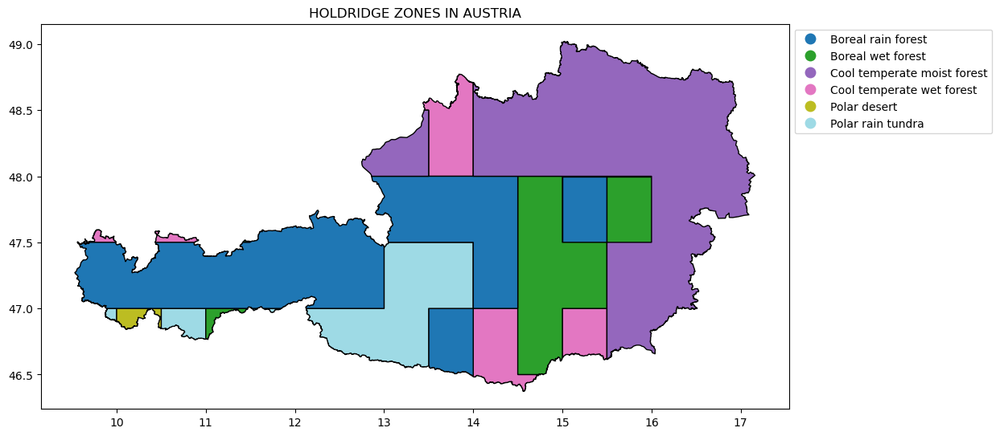

In [100]:
# Create plot
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Aut's holdridge life zones
aut_hldridge.plot(ax=ax, cmap="tab20", column="DESC", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("HOLDRIDGE ZONES IN AUSTRIA")

# Display plot
plt.show()

**Observation**

Austria exhibits a diverse range of Holdridge life zones, with the  Cool temperate moist forest being the most prevalent and the polar desert being less common

    4.4  TERRESTIAL ECOREGIONS

    4.41 LOAD DATASET

In [101]:
# Access Aut's terrestrial ecoregions dataset from google drive using "gdown" command
!gdown "1tkrT7UCaaMmEyr-xVGxTDPhFBSvGw_6M"

Downloading...
From (original): https://drive.google.com/uc?id=1tkrT7UCaaMmEyr-xVGxTDPhFBSvGw_6M
From (redirected): https://drive.google.com/uc?id=1tkrT7UCaaMmEyr-xVGxTDPhFBSvGw_6M&confirm=t&uuid=3d0daf76-fc4e-4978-9bdf-eb07b0723559
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\TerrestrialEcoregionsoftheWorld_WWF.geojson

  0%|          | 0.00/165M [00:00<?, ?B/s]
  0%|          | 524k/165M [00:02<14:51, 185kB/s]
  1%|          | 1.05M/165M [00:05<13:46, 199kB/s]
  1%|          | 1.57M/165M [00:06<10:44, 254kB/s]
  1%|1         | 2.10M/165M [00:11<16:49, 162kB/s]
  2%|1         | 2.62M/165M [00:15<17:49, 152kB/s]
  2%|1         | 3.15M/165M [00:16<13:19, 203kB/s]
  2%|2         | 3.67M/165M [00:20<16:05, 168kB/s]
  3%|2         | 4.19M/165M [00:22<13:10, 204kB/s]
  3%|2         | 4.72M/165M [00:22<10:20, 259kB/s]
  3%|3         | 5.24M/165M [00:23<08:12, 325kB/s]
  3%|3         | 5.77M/165M [00:25<08:20, 319kB/s]
  4%|

In [102]:
# Read geojson file into a geodataframe
terr_ecoregion = gpd.read_file("TerrestrialEcoregionsoftheWorld_WWF.geojson")

In [103]:
terr_ecoregion.head(2)

,OBJECTID_1,OBJECTID,AREA,ECO_NAME,REALM,BIOME,ECO_NUM,ECO_ID,ECO_SYM,GBL_STAT,...,G200_BIOME,G200_STAT,area_km2,eco_code,BIOME_1,GBL_STAT_1,REALM_1,Shape_Length,Shape_Area,geometry
0,1,1,29.802942,Northern Mesoamerican Pacific mangroves,NT,14,4,61404,119,1,...,0,0,8174,NT1404,,,Neotropics,0.219475,0.002769,"POLYGON ((-112.30433 29.33480, -112.29035 29.3..."
1,2,2,11.977824,Northern Mesoamerican Pacific mangroves,NT,14,4,61404,119,1,...,0,0,8174,NT1404,,,Neotropics,0.193289,0.001111,"POLYGON ((-112.19639 29.20719, -112.19669 29.2..."


In [104]:
# Extract information for Aut's terrestrial ecoregions
aut_ecoregion = terr_ecoregion.clip(aut_admin)
aut_ecoregion = aut_ecoregion.reset_index(drop=True)

In [105]:
aut_ecoregion.head(2)

,OBJECTID_1,OBJECTID,AREA,ECO_NAME,REALM,BIOME,ECO_NUM,ECO_ID,ECO_SYM,GBL_STAT,...,G200_BIOME,G200_STAT,area_km2,eco_code,BIOME_1,GBL_STAT_1,REALM_1,Shape_Length,Shape_Area,geometry
0,7612,7260,149870.804438,Alps conifer and mixed forests,PA,5,1,80501,76,2,...,5,1,149871,PA0501,,,Palearctic,45.800776,17.540100,"POLYGON ((12.95397 47.78815, 12.96074 47.78236..."
1,7464,7004,493836.322937,Western European broadleaf forests,PA,4,45,80445,75,1,...,0,0,493836,PA0445,,,Palearctic,116.461798,60.024201,"MULTIPOLYGON (((9.97051 47.51085, 9.96797 47.5..."


    4.42 UNDERSTAND THE DATA

In [106]:
# Check no.of rows and columns for world terrestrial ecoregions
terr_ecoregion.shape

(14351, 22)

The dataframe has 14351 rows and 22 columns.

In [107]:
# Check no.of rows and columns for Aut's terrestrial ecoregions
aut_ecoregion.shape

(4, 22)

The dataframe has 4 rows and 22 columns.

In [108]:
# View all column titles in the dataframe
aut_ecoregion.columns

Index(['OBJECTID_1', 'OBJECTID', 'AREA', 'ECO_NAME', 'REALM', 'BIOME',
       'ECO_NUM', 'ECO_ID', 'ECO_SYM', 'GBL_STAT', 'G200_REGIO', 'G200_NUM',
       'G200_BIOME', 'G200_STAT', 'area_km2', 'eco_code', 'BIOME_1',
       'GBL_STAT_1', 'REALM_1', 'Shape_Length', 'Shape_Area', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [109]:
# Check for unique value and their counts in the selected column
aut_ecoregion["ECO_NAME"].value_counts()

Alps conifer and mixed forests        1
Western European broadleaf forests    1
Pannonian mixed forests               1
Central European mixed forests        1
Name: ECO_NAME, dtype: int64

This shows the unique values and respective counts in the "ECO_NAME" column.

In [110]:
# Check the data-type of each column
aut_ecoregion.dtypes

OBJECTID_1         int64
OBJECTID           int64
AREA             float64
ECO_NAME          object
REALM             object
BIOME              int64
ECO_NUM            int64
ECO_ID             int64
ECO_SYM            int64
GBL_STAT           int64
G200_REGIO        object
G200_NUM           int64
G200_BIOME         int64
G200_STAT          int64
area_km2           int64
eco_code          object
BIOME_1           object
GBL_STAT_1        object
REALM_1           object
Shape_Length     float64
Shape_Area       float64
geometry        geometry
dtype: object

The above shows the data types for each column.

In [111]:
# Check information about the dataframe
aut_ecoregion.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   OBJECTID_1    4 non-null      int64   
 1   OBJECTID      4 non-null      int64   
 2   AREA          4 non-null      float64 
 3   ECO_NAME      4 non-null      object  
 4   REALM         4 non-null      object  
 5   BIOME         4 non-null      int64   
 6   ECO_NUM       4 non-null      int64   
 7   ECO_ID        4 non-null      int64   
 8   ECO_SYM       4 non-null      int64   
 9   GBL_STAT      4 non-null      int64   
 10  G200_REGIO    4 non-null      object  
 11  G200_NUM      4 non-null      int64   
 12  G200_BIOME    4 non-null      int64   
 13  G200_STAT     4 non-null      int64   
 14  area_km2      4 non-null      int64   
 15  eco_code      4 non-null      object  
 16  BIOME_1       4 non-null      object  
 17  GBL_STAT_1    4 non-null      object  
 18  REALM_

This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, whuch are represented with 'int64' and 'float64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [112]:
# Check the coordinate system of the dataframe
aut_ecoregion.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [113]:
# Check the geometric type of the dataframe
aut_ecoregion.geom_type

0         Polygon
1    MultiPolygon
2         Polygon
3         Polygon
dtype: object

The records for the dataframe have polygon and multipolygon geometric type.

    4.43 COMPREHENSIVE ANALYSIS

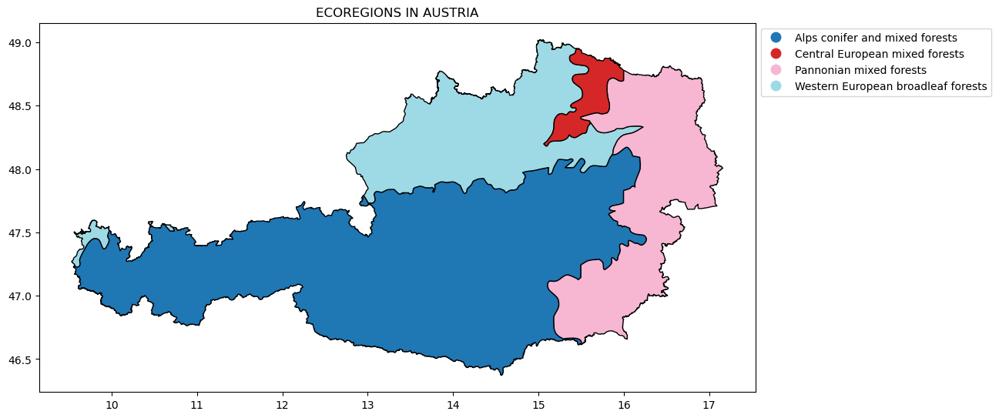

In [114]:
# Create plot for ecoregions
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Aut's terrestrial ecoregions
aut_ecoregion.plot(ax=ax, cmap="tab20", column="ECO_NAME", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("ECOREGIONS IN AUSTRIA")

# Display plot
plt.show()

In [115]:
# Create interactive map of the terrestrial ecoregions in Austria
aut_ecoregion.explore()

**Observation**

Austria's ecological landscape comprises four terrestrial ecoregions, with the Alps conifer and mixed forests emerging as the ecoregion with the widest coverage.This ecoregion alongside the other three play a significant role in shaping Austria's biodiversity and ecological dynamics.

    4.5 BIOCLIMATIC AND ECOLOGICAL OVERVIEW

**Overview**

Austria's ecological landscape is characterized by its diverse temperate mountain system, which spans across numerous states within the country. Interestingly, some states display a blend of two to three distinct ecological zones, adding complexity to Austria's environmental composition.

Among the agroecological zones, the Tropical-Arid agroecological zone exhibits a larger geographical coverage, despite being less frequent compared to the Boreal-Humid zone. This variation suggests that factors beyond frequency influence the distribution and extent of agroecological zones in Austria, indicating diverse environmental conditions and land use patterns across the nation.

Austria boasts a rich variety of Holdridge life zones, with the Cool temperate moist forest being the most prevalent, while the polar desert is less common.

Within Austria's ecological landscape lie four terrestrial ecoregions, with the Alps conifer and mixed forests standing out for their extensive coverage. These ecoregions, alongside others, play a crucial role in shaping Austria's biodiversity and ecological dynamics.

#### 5. SOIL

    5.0 SOIL RESOURCES

    5.01 LOAD DATASET

In [116]:
# Access Aut's soil resources dataset from google drive using "gdown" command
!gdown "15Y9e-45eMCYaw9CWGJ2eA6N6VO9ql9i2"

Downloading...
From: https://drive.google.com/uc?id=15Y9e-45eMCYaw9CWGJ2eA6N6VO9ql9i2
To: C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Internship\AUT_AL2_Austria_WSR.json

  0%|          | 0.00/4.03M [00:00<?, ?B/s]
 13%|#3        | 524k/4.03M [00:00<00:04, 742kB/s]
 26%|##6       | 1.05M/4.03M [00:01<00:03, 977kB/s]
 39%|###9      | 1.57M/4.03M [00:01<00:01, 1.30MB/s]
 52%|#####2    | 2.10M/4.03M [00:01<00:01, 1.48MB/s]
 65%|######5   | 2.62M/4.03M [00:01<00:00, 1.75MB/s]
 78%|#######8  | 3.15M/4.03M [00:02<00:00, 1.97MB/s]
 91%|#########1| 3.67M/4.03M [00:02<00:00, 2.15MB/s]
100%|##########| 4.03M/4.03M [00:02<00:00, 2.01MB/s]
100%|##########| 4.03M/4.03M [00:02<00:00, 1.64MB/s]


In [117]:
# Read geojson file into a geodataframe
aut_soil = gpd.read_file("AUT_AL2_Austria_WSR.json")

In [118]:
aut_soil.head(2)

,country,ISO3166_2,name,SNAME,mg_code,IPCC,adminlevel,geometry
0,AUT,,Austria,CH,27,Chernozem,2,"POLYGON ((16.56107 48.79827, 16.56081 48.79888..."
1,AUT,,Austria,CM,2,Cambisol,2,"MULTIPOLYGON (((16.03821 46.65646, 16.03824 46..."


    5.02 UNDERSTAND THE DATA

In [119]:
# Check no.of rows and columns for Aut's soil reosurces
aut_soil.shape

(6, 8)

The dataframe has 6 rows and 8 columns.

In [120]:
# View all column titles in the dataframe
aut_soil.columns

Index(['country', 'ISO3166_2', 'name', 'SNAME', 'mg_code', 'IPCC',
       'adminlevel', 'geometry'],
      dtype='object')

The above shows the names of the columns.

In [121]:
# Check for unique value and their counts in the selected column
aut_soil["IPCC"].value_counts()

Chernozem    1
Cambisol     1
Leptosol     1
Luvisol      1
Podzol       1
Umbrisol     1
Name: IPCC, dtype: int64

This shows the unique values and respective counts in the "IPCC" column.

In [122]:
# Check the data-type of each column
aut_soil.dtypes

country         object
ISO3166_2       object
name            object
SNAME           object
mg_code          int64
IPCC            object
adminlevel       int64
geometry      geometry
dtype: object

The above shows the data types for each column.

In [123]:
# Check information about the dataframe
aut_soil.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   country     6 non-null      object  
 1   ISO3166_2   6 non-null      object  
 2   name        6 non-null      object  
 3   SNAME       6 non-null      object  
 4   mg_code     6 non-null      int64   
 5   IPCC        6 non-null      object  
 6   adminlevel  6 non-null      int64   
 7   geometry    6 non-null      geometry
dtypes: geometry(1), int64(2), object(5)
memory usage: 516.0+ bytes


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types, numerical values, whuch are represented with 'int64' data types, and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [124]:
# Check the coordinate system of the dataframe
aut_soil.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [125]:
# Check the geometric type of the dataframe
aut_soil.geom_type

0         Polygon
1    MultiPolygon
2    MultiPolygon
3    MultiPolygon
4         Polygon
5         Polygon
dtype: object

The records for the dataframe have both the polygon and multipolygon geometric type.

    5.03 COMPREHENSIVE ANALYSIS

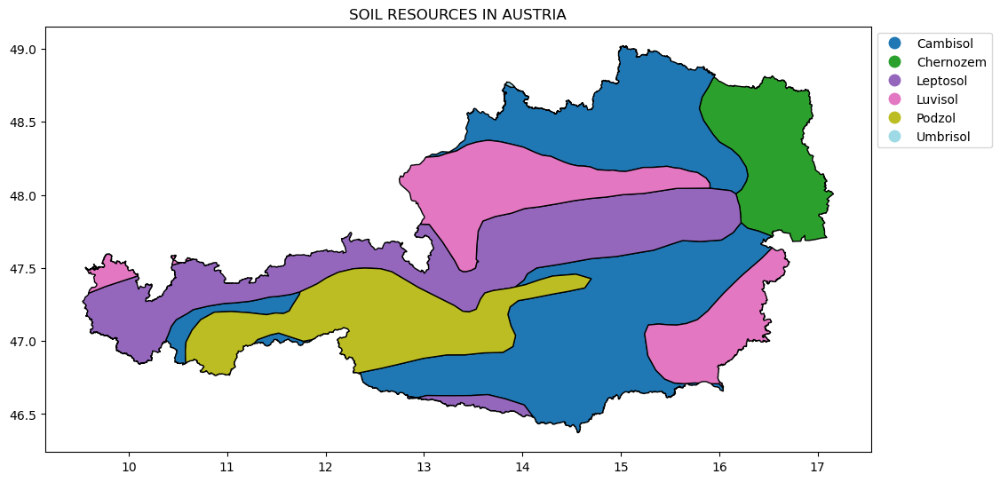

In [126]:
# Create plot for soil resources
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Arm's soil resoucrces
aut_soil.plot(ax=ax, cmap="tab20", column="IPCC", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("SOIL RESOURCES IN AUSTRIA")

# Display plot
plt.show()

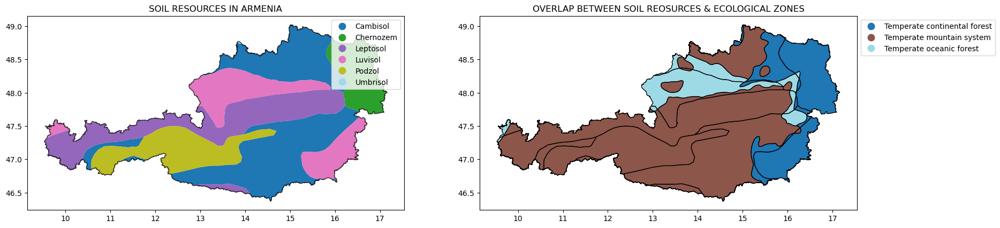

In [127]:
# Further investigate the intersection between soil resources and different terr. ecoregions.

from geopandas.tools import overlay

# Perform a spatial overlay between soil resources and terr. ecoregions
overlap = overlay(aut_soil, aut_gez, how="intersection", keep_geom_type=False)

# Create a subplot with two panels
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Plot the soil resources in panel 1
aut_soil.plot(column="IPCC", cmap="tab20", ax=ax1, legend=True)
aut_admin.plot(ax=ax1, color="none", edgecolor="black", alpha=0.8)
ax1.set_title("SOIL RESOURCES IN ARMENIA")

# Plot the overlapping areas between soils and ecoregions in panel 2
overlap.plot(ax=ax2, cmap="tab20", column="gez_name", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax2.set_title("OVERLAP BETWEEN SOIL REOSURCES & ECOLOGICAL")

# Display the plot
plt.show()

**Observation**

The soil resource mapping conducted in Austria provides valuable insights into the nation's diverse soil composition, highlighting six distinct soil types that play crucial roles in supporting various ecosystems and land uses. Among these, Cambisol stands out as the soil resource with the broadest coverage, underscoring its prevalence and significance across Austria's landscapes.

Furthermore, the spatial distribution of soil resources reveals interesting patterns of coexistence within specific ecological zones. For instance, within the Temperate mountain system forest, a blend of about four soil resources is evident. This co-occurrence emphasizes the intricate interplay between soil formation processes, climatic conditions, and vegetation dynamics within distinct ecological settings.

    6.1 SOIL RESOURCES OVERVIEW

**Overview**

Armenia's ecosystems are shaped by six main soil types, each with unique characteristics and contributions to the environment. Cambisols, characterized by young soil development, are found across various vegetation types and contribute significantly to food security. Chernozems, known for their deep, dark, and fertile topsoil, play a crucial role in agricultural productivity, supporting crops like maize, wheat, sugar beet, and sunflower.

On the other hand, Leptosols, prevalent in mountainous regions, have shallow soil profiles and rocky surfaces, making them unsuitable for agriculture but suitable for seasonal grazing and forestry. Luvisols, with clay-enriched subsoil, are highly productive and support agriculture, forestry, and grazing. Similarly, Podzols, known for their Fe/Al chemistry, support coniferous forests and regulate water balance.

Meanwhile, Umbrisols, characterized by organic-rich topsoil and acidic conditions, contribute to water runoff and are mainly found in mountainous regions. The spatial distribution of these soil resources within ecological zones highlights the intricate relationship between soil formation processes, climate, and vegetation dynamics.


#### 6. CLIMATE

    6.0 CLIMATE ZONE

    6.01 LOAD DATASET

In [128]:
# Access world climate zones from local computer
climzones = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\IPCC_ClimateZoneMap_Vector.geojson")

In [129]:
# Read geojson file into a geodataframe
wrld_climzones = gpd.read_file(climzones)

In [130]:
wrld_climzones.head(2)

,CLASS_NAME,geometry
0,0,"MULTIPOLYGON (((-37.65000 83.50000, -37.65000 ..."
1,0,"MULTIPOLYGON (((-38.75000 83.40000, -38.75000 ..."


    7.02 UNDERSTAND THE DATA

In [131]:
# Check no.of rows and columns for world climate zones
wrld_climzones.shape

(26165, 2)

The dataframe has 26165 rows and 2 columns.

In [132]:
# Check for unique values present in the value column
wrld_climzones["CLASS_NAME"].unique()

array([ 0,  5,  6,  7,  8,  3,  4,  1,  2, 12, 11,  9, 10], dtype=int64)

In [133]:
# Fix data and replace numbers with climate zones
classification =  {"0": "Not Defined", "1" : "Warm Temperate Moist", "2" : "Warm Temperate Dry", "3" : "Cool Temperate Moist", "4" : "Cool Temperate Dry", "5" : "Polar Moist",
    "6" : "Polar Dry", "7" : "Boreal Moist", "8" : "Boreal Dry", "9" : "Tropical Montane", "10" : "Tropical Wet", "11" : "Tropical Moist", "12" : "Tropical Dry"}

In [134]:
# Rename class name
wrld_climzones.CLASS_NAME = wrld_climzones.CLASS_NAME.astype("str").replace(classification)

In [135]:
wrld_climzones.head(2)

,CLASS_NAME,geometry
0,Not Defined,"MULTIPOLYGON (((-37.65000 83.50000, -37.65000 ..."
1,Not Defined,"MULTIPOLYGON (((-38.75000 83.40000, -38.75000 ..."


In [136]:
# Extract Austria's climate zones zones
aut_climzones = wrld_climzones.clip(aut_admin)
aut_climzones = aut_climzones.reset_index(drop=True)

In [137]:
aut_climzones.head(2)

,CLASS_NAME,geometry
0,Polar Moist,"POLYGON ((10.50000 46.85000, 10.50000 46.84757..."
1,Polar Moist,"POLYGON ((10.60000 46.90000, 10.65000 46.90000..."


In [138]:
# Check no.of rows and columns for Austria's climate zones
aut_climzones.shape

(19, 2)

The dataframe has 10 rows and 2 columns.

In [139]:
# View all column titles in the dataframe
aut_climzones.columns

Index(['CLASS_NAME', 'geometry'], dtype='object')

The above shows the names of the columns.

In [140]:
# Check for unique value and their counts in the selected column
aut_climzones["CLASS_NAME"].value_counts()

Polar Moist             11
Cool Temperate Moist     5
Warm Temperate Dry       2
Cool Temperate Dry       1
Name: CLASS_NAME, dtype: int64

This shows the unique values and respective counts in the "CLASS_NAME" column.

In [141]:
# Check the data-type of each column
aut_climzones.dtypes

CLASS_NAME      object
geometry      geometry
dtype: object

The above shows the data types for each column.

In [142]:
# Check information about the dataframe
aut_climzones.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 19 entries, 0 to 18
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   CLASS_NAME  19 non-null     object  
 1   geometry    19 non-null     geometry
dtypes: geometry(1), object(1)
memory usage: 436.0+ bytes


This provides basic information about the dataframe. It contains categorical values, which are represented by columns with 'object' data types and geometric data, which is stored in columns with 'geometry' data types. Geometric data represents spatial or geographic information.

In [143]:
# Check the coordinate system of the dataframe
aut_climzones.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

The Coordinate System of the dataframe is 4326, which is the WGS 84 Coordinate System.

In [144]:
# Check the geometric type of the dataframe
aut_climzones.geom_type

0          Polygon
1          Polygon
2     MultiPolygon
3          Polygon
4     MultiPolygon
5     MultiPolygon
6          Polygon
7          Polygon
8          Polygon
9     MultiPolygon
10         Polygon
11         Polygon
12         Polygon
13         Polygon
14         Polygon
15         Polygon
16         Polygon
17         Polygon
18         Polygon
dtype: object

The records for the dataframe have polygon and multipolygon geometric type.

    6.03 COMPREHENSIVE ANALYSIS

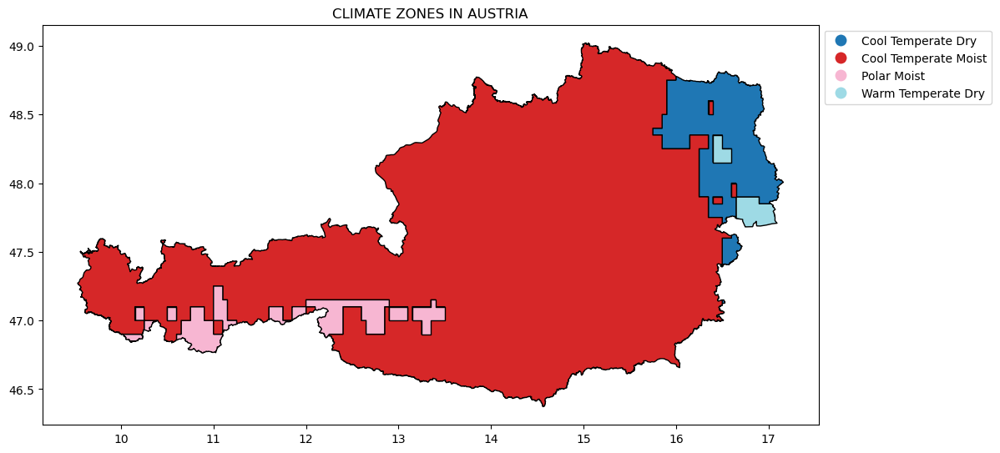

In [145]:
# Create plot for soil resources
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the Aut's soil resoucrces
aut_climzones.plot(ax=ax, cmap="tab20", column="CLASS_NAME", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, edgecolor="black")
ax.set_title("CLIMATE ZONES IN AUSTRIA")

# Display plot
plt.show()

In [146]:
# Re-project geometries to a projected CRS
aut_climzones = aut_climzones.to_crs(projected_crs)

#Calculate and print the area for each geometry 
aut_climzones["area"] = aut_climzones.geometry.area

In [147]:
aut_climzones.head(2)

,CLASS_NAME,geometry,area
0,Polar Moist,"POLYGON ((156951.203 5198333.555, 156935.716 5...",7.406654e+04
1,Polar Moist,"POLYGON ((164885.503 5203455.898, 168693.132 5...",8.175893e+08


In [148]:
# Create interactive map of the climate zones in Austria
aut_climzones.explore()

**Observation**

In Austria, the polar moist climate zone emerges as the most frequently occurring climate zone. However, despite its lower frequency, the Cool temperate moist climate zone exhibits significant prevalence, boasting a broad distribution across the country. This observation underscores the diverse climatic conditions present in Austria, ranging from polar to temperate climates. Each climate zone plays a crucial role in shaping local ecosystems and influencing agricultural practices, highlighting the importance of understanding and adapting to Austria's varied climatic landscapes.

    6.1 KOPPEN-GIEGER CLIMATE CHANGES (1901 -2100)

    6.11 LOAD DATASETS

In [149]:
# Access world climate shifts from 1901 -2100 from local computer
climateshift_25 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\1901-1925.geojson")
climateshift_50 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\1926-1950.geojson")
climateshift_75 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\1951-1975.geojson")
climateshift_00 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\1976-2000.geojson")
climateshift_A125 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2001-2025-A1FI.geojson")
climateshift_A225 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2001-2025-A2.geojson")
climateshift_B125 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2001-2025-B1.geojson")
climateshift_B225 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2001-2025-B2.geojson")
climateshift_A150 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2026-2050-A1FI.geojson")
climateshift_A250 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2026-2050-A2.geojson")
climateshift_B150 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2026-2050-B1.geojson")
climateshift_B250 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2026-2050-B2.geojson")
climateshift_A175 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2051-2075-A1FI.geojson")
climateshift_A275 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2051-2075-A2.geojson")
climateshift_B175 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2051-2075-B1.geojson")
climateshift_B275 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2051-2075-B2.geojson")
climateshift_A1100 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2076-2100-A1FI.geojson")
climateshift_A2100 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2076-2100-A2.geojson")
climateshift_B1100 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2076-2100-B1.geojson")
climateshift_B2100 = (r"C:\Users\User\Documents\Scholarships application\Women Techstars Application\internships\Outreachy\Contribution\Outreachy_Nwajiunor_2023\KoppenGeigerClimateShifts\2076-2100-B2.geojson")

In [150]:
# Read geojson files into  geodataframe
shift_25 = gpd.read_file(climateshift_25)
shift_50 = gpd.read_file(climateshift_50)
shift_75 = gpd.read_file(climateshift_75)
shift_00 = gpd.read_file(climateshift_00)
shift_A125 = gpd.read_file(climateshift_A125)
shift_A225 = gpd.read_file(climateshift_A225)
shift_B125 = gpd.read_file(climateshift_B125)
shift_B225 = gpd.read_file(climateshift_B225)
shift_A150 = gpd.read_file(climateshift_A150)
shift_A250 = gpd.read_file(climateshift_A250)
shift_B150 = gpd.read_file(climateshift_B150)
shift_B250 = gpd.read_file(climateshift_B250)
shift_A175 = gpd.read_file(climateshift_A175)
shift_A275 = gpd.read_file(climateshift_A275)
shift_B175 = gpd.read_file(climateshift_B175)
shift_B275 = gpd.read_file(climateshift_B275)
shift_A1100 = gpd.read_file(climateshift_A1100)
shift_A2100 = gpd.read_file(climateshift_A2100)
shift_B1100 = gpd.read_file(climateshift_B1100)
shift_B2100 = gpd.read_file(climateshift_B2100)

In [151]:
# Check for the top two rows using any of the dataframes
shift_50.head(2)

,OBJECTID,ID,GRIDCODE,Shape_Length,Shape_Area,geometry
0,1,1,62,2.0,0.25,"POLYGON ((-37.50000 83.50000, -37.50000 84.000..."
1,2,2,62,5.0,1.00,"POLYGON ((-46.00000 83.00000, -44.00000 83.000..."


    6.12 UNDERSTAND THE DATA

In [152]:
# understand the data using one of the dataframes

# Check no.of rows and columns for any dataframe
shift_25.shape

(2319, 6)

The dataframe has 2319 rows and 6 columns.

In [153]:
# Check for unique values present in the value column
shift_25["GRIDCODE"].unique()

array([62, 61, 44, 52, 43, 47, 51, 48, 33, 42, 32, 46, 50, 26, 35, 36, 41,
       31, 45, 34, 21, 49, 38, 37, 22, 27, 39, 14, 12, 13, 11],
      dtype=int64)

In [154]:
# Check for unique values present in the value column in another dataframe
shift_A225["GRIDCODE"].unique()

array([62., 61., 44., 47., 43., 51., 33., 52., 32., 42., 26., 50., 41.,
       35., 46., 49., 21., 31., 45., 34., 27., 22., 37., 36., 38., 39.,
       12., 14., 13., 11., nan])

Both dataframes contan different datatypes in the 'GRIDCODE' column

In [155]:
# Iterate through dataframes and update GRIDCODE column to integers

# List of dataframes to iterate through
dataframes = [shift_25, shift_50, shift_75, shift_00, 
              shift_A125, shift_A225, shift_B125, shift_B225, 
              shift_A150, shift_A250, shift_B150, shift_B250, 
              shift_A175, shift_A275, shift_B175, shift_B275, 
              shift_A1100, shift_A2100, shift_B1100, shift_B2100]

# Iterate through dataframes
for df in dataframes:
    # Check for non-finite values and replace them with a default value. In this case, 0
    df["GRIDCODE"] = df["GRIDCODE"].replace([np.inf, -np.inf, np.nan], 0)
    
    # Convert the GRIDCODE column to integers
    df["GRIDCODE"] = df["GRIDCODE"].astype(int)


In [156]:
# Fix data and replace numbers with climate classes using the Koppen-Geiger system
koppen_abb = {"11": "Af", "12": "Am", "13": "As", "14": "Aw", "21": "BWk", "22": "BWh", "26": "BSk", "27": "BSh", "31": "Cfa", 
              "32": "Cfb", "33": "Cfc", "34": "Csa", "35": "Csb", "36": "Csc", "37": "Cwa", "38": "Cwb", "39": "Cwc", "41": "Dfa", 
              "42": "Dfb", "43": "Dfc", "44": "Dfd", "45": "Dsa", "46": "Dsb", "47": "Dsc", "48": "Dsd", "49": "Dwa", "50": "Dwb", 
              "51": "Dwc", "52": "Dwd", "61": "EF", "62": "ET"}


In [157]:
# Rename class name for all dataframes
shift_25.GRIDCODE = shift_25.GRIDCODE.astype("str").replace(koppen_abb)
shift_50.GRIDCODE = shift_50.GRIDCODE.astype("str").replace(koppen_abb)
shift_75.GRIDCODE = shift_75.GRIDCODE.astype("str").replace(koppen_abb)
shift_00.GRIDCODE = shift_00.GRIDCODE.astype("str").replace(koppen_abb)
shift_A125.GRIDCODE = shift_A125.GRIDCODE.astype("str").replace(koppen_abb)
shift_A225.GRIDCODE = shift_A225.GRIDCODE.astype("str").replace(koppen_abb)
shift_B125.GRIDCODE = shift_B125.GRIDCODE.astype("str").replace(koppen_abb)
shift_B225.GRIDCODE = shift_B225.GRIDCODE.astype("str").replace(koppen_abb)
shift_A150.GRIDCODE = shift_A150.GRIDCODE.astype("str").replace(koppen_abb)
shift_A250.GRIDCODE = shift_A250.GRIDCODE.astype("str").replace(koppen_abb)
shift_B150.GRIDCODE = shift_B150.GRIDCODE.astype("str").replace(koppen_abb)
shift_B250.GRIDCODE = shift_B250.GRIDCODE.astype("str").replace(koppen_abb)
shift_A175.GRIDCODE = shift_A175.GRIDCODE.astype("str").replace(koppen_abb)
shift_A275.GRIDCODE = shift_A275.GRIDCODE.astype("str").replace(koppen_abb)
shift_B175.GRIDCODE = shift_B175.GRIDCODE.astype("str").replace(koppen_abb)
shift_B275.GRIDCODE = shift_B275.GRIDCODE.astype("str").replace(koppen_abb)
shift_A1100.GRIDCODE = shift_A1100.GRIDCODE.astype("str").replace(koppen_abb)
shift_A2100.GRIDCODE = shift_A2100.GRIDCODE.astype("str").replace(koppen_abb)
shift_B1100.GRIDCODE = shift_B1100.GRIDCODE.astype("str").replace(koppen_abb)
shift_B2100.GRIDCODE = shift_B2100.GRIDCODE.astype("str").replace(koppen_abb)

In [158]:
# Define mappings for abbreviated climate classes
koppen_term = {
    "Af": "Tropical rainforest climate", "Am": "Tropical monsoon climate",
    "As": "Tropical savanna climate with dry-summer characteristics",
    "Aw": "Tropical savanna climate with dry-winter characteristics",
    "BWk": "Cold desert climate", "BWh": "Hot desert climate",
    "BSk": "Cold semi-arid climate", "BSh": "Hot semi-arid climate",
    "Cfa": "Humid subtropical climate;", "Cfb": "Temperate oceanic climate",
    "Cfc": "Subpolar oceanic climate", "Csa": "Hot-summer Mediterranean climate",
    "Csb": "Warm-summer Mediterranean climate", "Csc": "Cold-summer Mediterranean climate",
    "Cwa": "Monsoon-influenced humid subtropical climate", "Cwb": "Subtropical highland climate",
    "Cwc": "Cold subtropical highland climate", "Dfa": "Hot-summer humid continental climate",
    "Dfb": "Warm-summer humid continental climate", "Dfc": "Subarctic climate",
    "Dfd": "Extremely cold subarctic climate", "Dsa": "Mediterranean-influenced hot-summer humid continental climate",
    "Dsb": "Mediterranean-influenced warm-summer humid continental climate",
    "Dsc": "Mediterranean-influenced subarctic climate", "Dsd": "Mediterranean-influenced extremely cold subarctic climate",
    "Dwa": "Monsoon-influenced hot-summer humid continental climate",
    "Dwb": "Monsoon-influenced warm-summer humid continental climate",
    "Dwc": "Monsoon-influenced subarctic climate",
    "Dwd": "Monsoon-influenced extremely cold subarctic climate",
    "EF": "Ice cap climate", "ET": "Tundra climate"
}

# Iterate through dataframes and update GRIDCODE column
for df in dataframes:
    df["GRIDCODE"] = df["GRIDCODE"].astype("str").replace(koppen_abb)

# Create a new column for defined climate classes in full terms
for df in dataframes:
    df["koppen_term"] = "Unknown"
    df["koppen_term"] = df["GRIDCODE"].map(koppen_term)

In [159]:
# Check dataframe after mapping
shift_25.head(2)

,OBJECTID,ID,GRIDCODE,Shape_Length,Shape_Area,geometry,koppen_term
0,1,1,ET,2.0,0.25,"POLYGON ((-37.50000 83.50000, -37.50000 84.000...",Tundra climate
1,2,2,ET,16.0,3.75,"POLYGON ((-29.50000 83.50000, -29.50000 84.000...",Tundra climate


In [160]:
shift_A225.head(2)

,OBJECTID,ID,GRIDCODE,Shape_Length,Shape_Area,geometry,koppen_term
0,1,1.0,ET,1.874914,0.160097,"POLYGON ((-37.50000 83.50000, -37.75000 84.140...",Tundra climate
1,2,2.0,ET,5.000000,1.000000,"POLYGON ((-46.00000 83.00000, -44.00000 83.000...",Tundra climate


In [161]:
# Extract Austria's climate shifts
aut_climshifts_25 = shift_25.clip(aut_admin)
aut_climshifts_25 = aut_climshifts_25.reset_index(drop=True)

aut_climshifts_50 = shift_50.clip(aut_admin)
aut_climshifts_50 = aut_climshifts_50.reset_index(drop=True)

aut_climshifts_75 = shift_75.clip(aut_admin)
aut_climshifts_75 = aut_climshifts_75.reset_index(drop=True)

aut_climshifts_00 = shift_00.clip(aut_admin)
aut_climshifts_00 = aut_climshifts_00.reset_index(drop=True)

aut_climshifts_A125 = shift_A125.clip(aut_admin)
aut_climshifts_A125 = aut_climshifts_A125.reset_index(drop=True)

aut_climshifts_A225 = shift_A225.clip(aut_admin)
aut_climshifts_A225 = aut_climshifts_A225.reset_index(drop=True)

aut_climshifts_B125 = shift_B125.clip(aut_admin)
aut_climshifts_B125 = aut_climshifts_B125.reset_index(drop=True)

aut_climshifts_B225 = shift_B225.clip(aut_admin)
aut_climshifts_B225 = aut_climshifts_B225.reset_index(drop=True)

aut_climshifts_A150 = shift_A150.clip(aut_admin)
aut_climshifts_A150 = aut_climshifts_A150.reset_index(drop=True)

aut_climshifts_A250 = shift_A250.clip(aut_admin)
aut_climshifts_A250 = aut_climshifts_A250.reset_index(drop=True)

aut_climshifts_B150 = shift_B150.clip(aut_admin)
aut_climshifts_B150 = aut_climshifts_B150.reset_index(drop=True)

aut_climshifts_B250 = shift_B250.clip(aut_admin)
aut_climshifts_B250 = aut_climshifts_B250.reset_index(drop=True)

aut_climshifts_A175 = shift_A175.clip(aut_admin)
aut_climshifts_A175 = aut_climshifts_A175.reset_index(drop=True)

aut_climshifts_A275 = shift_A275.clip(aut_admin)
aut_climshifts_A275 = aut_climshifts_A275.reset_index(drop=True)

aut_climshifts_B175 = shift_B175.clip(aut_admin)
aut_climshifts_B175 = aut_climshifts_B175.reset_index(drop=True)

aut_climshifts_B275 = shift_B275.clip(aut_admin)
aut_climshifts_B275 = aut_climshifts_B275.reset_index(drop=True)

aut_climshifts_A1100 = shift_A1100.clip(aut_admin)
aut_climshifts_A1100 = aut_climshifts_A1100.reset_index(drop=True)

aut_climshifts_A2100 = shift_A2100.clip(aut_admin)
aut_climshifts_A2100 = aut_climshifts_A2100.reset_index(drop=True)

aut_climshifts_B1100 = shift_B1100.clip(aut_admin)
aut_climshifts_B1100 = aut_climshifts_B1100.reset_index(drop=True)

aut_climshifts_B2100 = shift_B2100.clip(aut_admin)
aut_climshifts_B2100 = aut_climshifts_B2100.reset_index(drop=True)

In [162]:
# Read dataframe 
aut_climshifts_B175.head(2)

,OBJECTID,ID,GRIDCODE,Shape_Length,Shape_Area,geometry,koppen_term
0,549,549,ET,3.0,0.5,"MULTIPOLYGON (((10.50000 47.00000, 11.00000 47...",Tundra climate
1,550,550,Dfc,3.0,0.5,"MULTIPOLYGON (((12.50000 47.00000, 12.50000 46...",Subarctic climate


In [163]:
aut_climshifts_A225.head(2)

,OBJECTID,ID,GRIDCODE,Shape_Length,Shape_Area,geometry,koppen_term
0,469,469.0,Dfc,2.0,0.25,"POLYGON ((14.00000 46.50000, 14.00000 46.48545...",Subarctic climate
1,451,451.0,ET,3.0,0.50,"MULTIPOLYGON (((12.50000 47.00000, 12.50000 46...",Tundra climate


    6.13 COMPREHENSIVE ANALYSIS

    CLIMATE SHIFTS USING OBSERVATIONS FOR 1901 -2000

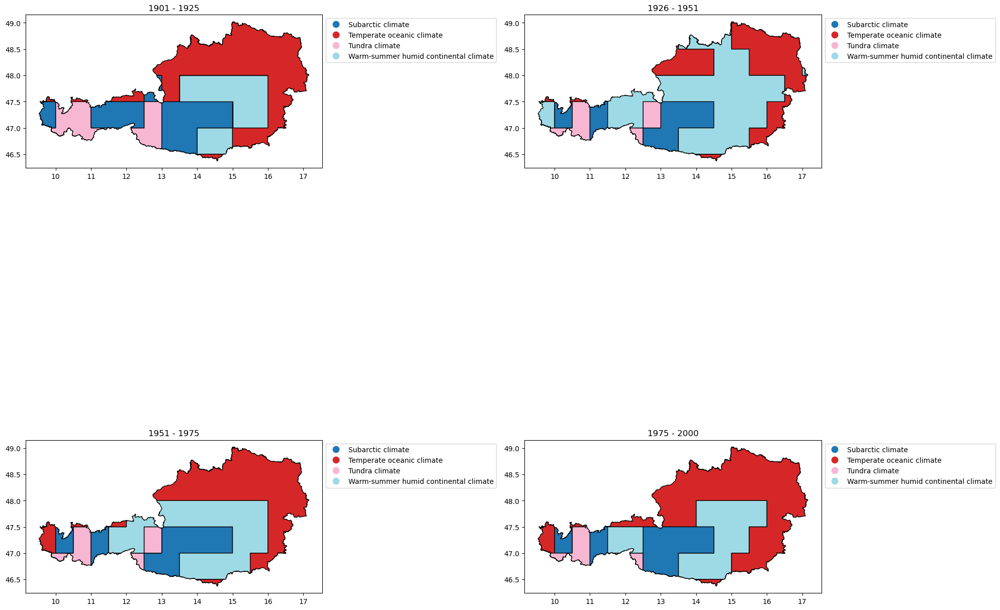

In [164]:
# Create a subplot with two panels on one row
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# Plot for 1901-1925 in panel 1
aut_climshifts_25.plot(ax=ax1, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax1.set_title("1901 - 1925")

# Plot for 1926-1950 in panel 2
aut_climshifts_50.plot(ax=ax2, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("1926 - 1951")

# Plot for 1951-1975 in panel 3
aut_climshifts_75.plot(ax=ax3, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax3.set_title("1951 - 1975")

# Plot for 1975-2000 in panel 4
aut_climshifts_00.plot(ax=ax4, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax4.set_title("1975 - 2000")

# Adjust layout for better appearance
plt.tight_layout()

# Display the plot
plt.show()


**Observation**

Austria's primary climatic profile was characterized by the Temperate oceanic climate, which dominated from 1901 to 2025. Following this period, the Warm-summer-humid-continental climate and the Subarctic climate also showed notable presence, albeit to a lesser extent. However, a significant shift occurred by 2026 when the Warm-summer humid continental climate displaced the Temperate oceanic climate as the dominant climate type.

By 1951, both the Temperate oceanic climate and Warm-summer-humid-continental climate emerged as the two most dominant climatic types. However, by 1975, the Temperate oceanic climate took the lead by a considerable margin compared to other climates. Notably, all four climate types remained consistently present throughout the period from 1901 to 2000 without any becoming obsolete, indicating the resilience and persistence of Austria's climatic diversity over time.

     A1F1 CLIMATE SECENARIO

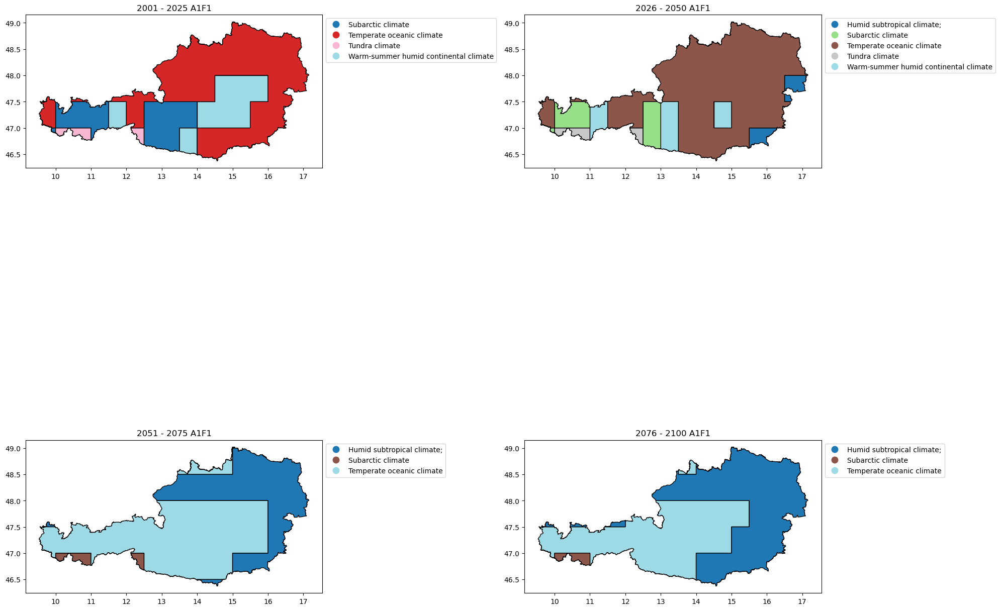

In [165]:
# Create a subplot with two panels on one row
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# Plot for 2001-2025 in panel 1
aut_climshifts_A125.plot(ax=ax1, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax1.set_title("2001 - 2025 A1F1")

# Plot for 2026-2050 in panel 2
aut_climshifts_A150.plot(ax=ax2, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("2026 - 2050 A1F1")

# Plot for 2051-2075 in panel 3
aut_climshifts_A175.plot(ax=ax3, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax3.set_title("2051 - 2075 A1F1")

# Plot for 2076-2100 in panel 4
aut_climshifts_A1100.plot(ax=ax4, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax4.set_title("2076 - 2100 A1F1")

# Adjust layout for better appearance
plt.tight_layout()

# Display the plot
plt.show()


**Observation**

The A1F1 scenario presents concerning projections for future climate change in Austria. It forecasts the Temperate oceanic climate as the most prevalent from 2001 to 2100, with fluctuations in its coverage anticipated throughout the century. Despite these fluctuations, it is expected to maintain its dominance overall. Furthermore, the introduction of the Humid subtropical climate by 2026 indicates significant shifts in Austria's climatic landscape over the twenty-first century, highlighting the dynamic nature of climate change impacts on the region.

    A2 CLIMATE SCENARIO

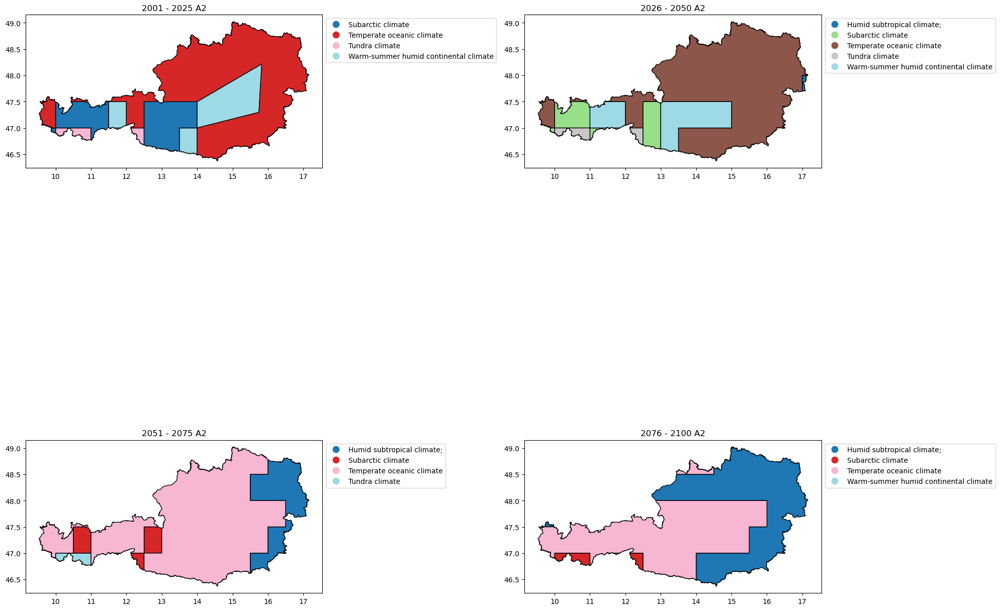

In [166]:
# Create a subplot with two panels on one row
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# Plot for 2001-2025 in panel 1
aut_climshifts_A225.plot(ax=ax1, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax1.set_title("2001 - 2025 A2")

# Plot for 2026-2050 in panel 2
aut_climshifts_A250.plot(ax=ax2, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("2026 - 2050 A2")

# Plot for 2051-2075 in panel 3
aut_climshifts_A275.plot(ax=ax3, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax3.set_title("2051 - 2075 A2")

# Plot for 2076-2100 in panel 4
aut_climshifts_A2100.plot(ax=ax4, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax4.set_title("2076 - 2100 A2")

# Adjust layout for better appearance
plt.tight_layout()

# Display the plot
plt.show()


**Observation**

According to the A2 climate scenario projections, the Temperate oceanic climate remains the most prevalent climate in Austria from 2001 to 2100. Initially, between 2001 and 2025, the Subarctic climate follows as the second most dominant climate, but it is displaced by the Warm-summer humid continental climate by 2026. The Warm-summer humid continental climate then becomes obsolete by 2051 before resurfacing by 2076. By 2051, the Humid subtropical climate emerges as the second most dominant climate, although still trailing behind the Temperate oceanic climate. These findings suggest significant shifts and fluctuations in Austria's climate composition over the twenty-first century, highlighting the need for adaptive measures to address changing environmental conditions.

    B1 CLIMATE SCENARIO

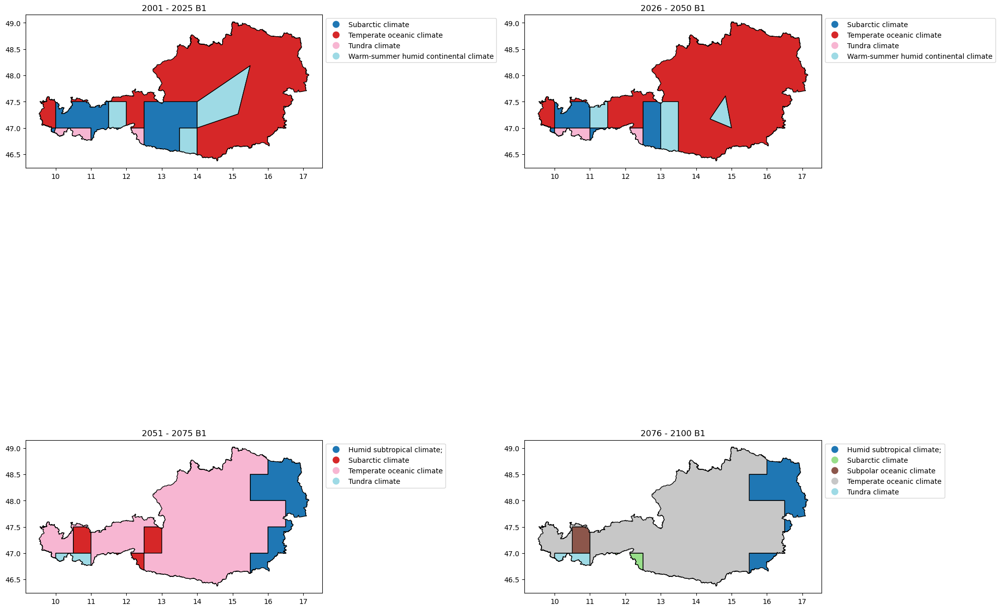

In [167]:
# Create a subplot with two panels on one row
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# Plot for 2001-2025 in panel 1
aut_climshifts_B125.plot(ax=ax1, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax1.set_title("2001 - 2025 B1")

# Plot for 2026-2050 in panel 2
aut_climshifts_B150.plot(ax=ax2, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("2026 - 2050 B1")

# Plot for 2051-2075 in panel 3
aut_climshifts_B175.plot(ax=ax3, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax3.set_title("2051 - 2075 B1")

# Plot for 2076-2100 in panel 4
aut_climshifts_B1100.plot(ax=ax4, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax4.set_title("2076 - 2100 B1")

# Adjust layout for better appearance
plt.tight_layout()

# Display the plot
plt.show()


**Observation**

In the B1 climate scenario, projections indicate that the Temperate oceanic climate is expected to be the most dominant from 2001 to 2100. This is followed by the Subarctic climate until 2050, after which the Humid subtropical climate emerges as the second most dominant by 2051. Additionally, a new climate, the subpolar oceanic climate, is expected to emerge by 2076.

    B2 CLIMATE SCENARIO

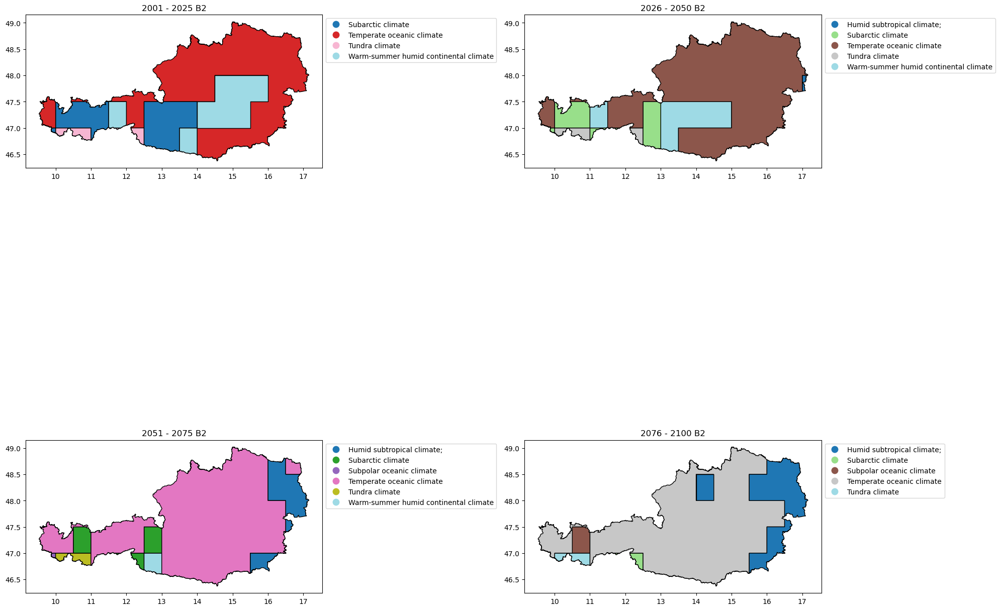

In [168]:
# Create a subplot with two panels on one row
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))

# Plot for 2001-2025 in panel 1
aut_climshifts_B225.plot(ax=ax1, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax1.set_title("2001 - 2025 B2")

# Plot for 2026-2050 in panel 2
aut_climshifts_B250.plot(ax=ax2, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax2.set_title("2026 - 2050 B2")

# Plot for 2051-2075 in panel 3
aut_climshifts_B275.plot(ax=ax3, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax3.set_title("2051 - 2075 B2")

# Plot for 2076-2100 in panel 4
aut_climshifts_B2100.plot(ax=ax4, column="koppen_term", legend=True, legend_kwds={"bbox_to_anchor": (1, 1), "loc": "upper left"}, cmap="tab20", edgecolor="black")
ax4.set_title("2076 - 2100 B2")

# Adjust layout for better appearance
plt.tight_layout()

# Display the plot
plt.show()


**Observation**

According to the B2 climate scenario, the Temperate oceanic climate is projected to be the most dominant in Austria from 2001 to 2100. Initially, the Warm-summer humid continental climate is anticipated to be the second most dominant between 2001 and 2050, but by 2051, it is expected to be displaced by the Humid subtropical climate. Interestingly, the Warm-summer humid continental climate becomes obsolete by 2076. These observations highlight the dynamic nature of Austria's climate

    6.2 CLIMATE OVERVIEW

**Overview**

Austria's climate exhibits a diverse range of zones, with the polar moist climate zone being the most frequent and the Cool temperate moist climate zone also prevalent. These variations underscore the dynamic nature of Austria's climate, shaping local ecosystems and agricultural practices.

Historically, the Temperate oceanic climate dominated Austria until 2025, but the Warm-summer-humid-continental climate emerged as dominant by 2026. Throughout the twentieth century, both were prominent, with the Temperate oceanic climate leading significantly by 1975. All four climate types persisted without becoming obsolete, highlighting Austria's climatic resilience.

Under different climate scenarios, such as A1F1, A2, B1, and B2, the dominance of the Temperate oceanic climate remains consistent, albeit with fluctuations and the emergence of new climate types like the Humid subtropical and subpolar oceanic climates in certain scenarios.

Climate shifts in Austria have multifaceted impacts across various sectors, including agriculture, ecosystems, water resources, infrastructure, and tourism. These changes require adaptive strategies to mitigate risks and capitalize on emerging opportunities. Agriculture faces challenges such as altered growing seasons and water availability, necessitating adjustments in cultivation practices and water management. Ecosystems are affected by shifts in species distribution and habitat suitability, influencing biodiversity and natural processes. Water resources are impacted by changes in precipitation patterns and snowmelt timing, affecting water supply and flood risks. Infrastructure resilience is crucial in the face of increased temperatures and extreme weather events, requiring upgrades and adaptations. Additionally, the tourism and recreation sectors may experience shifts in seasonal activities and visitor patterns, necessitating adaptive strategies to maintain competitiveness and sustainability.

Proactive measures and interdisciplinary approaches are essential to address the complex challenges posed by climate shifts in Austria.

#### 7. SUMMARY AND RECOMMENDATION

Austria, encompassing approximately 83 billion square meters of diverse terrain, is characterized by a rich ecological tapestry across its nine states, with Lower Austria standing as the largest in terms of size. Within this expansive landscape, Austria hosts a remarkable array of protected areas, totaling 1643 across 20 distinct categories, although challenges persist in documenting ownership structures accurately. Moreover, the classification of road networks reveals a predominance of unspecified roads (FCLASS 0), underscoring the need for detailed documentation to optimize transportation planning and infrastructure development across the country's varied topography.

Austria's ecological richness is further accentuated by its diverse soil resources, including Cambisols, Chernozems, Leptosols, Luvisols, Podzols, and Umbrisols. These soil types play crucial roles in supporting agricultural productivity, regulating water runoff, and maintaining ecosystem resilience. 

Additionally, Austria's climate exhibits a diverse range of zones, with the polar moist climate zone being the most frequent and the Cool temperate moist climate zone also prevalent. These variations underscore the dynamic nature of Austria's climate, shaping local ecosystems and agricultural practices. Austria's shifts in climate have multifaceted impacts across various sectors, including agriculture, ecosystems, water resources, infrastructure, and tourism. These changes require adaptive strategies to mitigate risks and capitalize on emerging opportunities

ACTIONABLE INSIGHTS AND RECOMMENDATION

1. Enhance Data Quality and Documentation: Implement robust mechanisms to address data quality issues surrounding protected area ownership and road infrastructure. Accurate documentation will enable effective conservation efforts, optimize transportation planning, and facilitate infrastructure development.

2. Promote Sustainable Land Use Practices: Advocate for the adoption of sustainable land management practices, particularly within Austria's diverse agroecological zones. Tailored soil conservation initiatives, informed by the unique characteristics of each soil type, can optimize agricultural productivity while safeguarding against erosion and degradation. Emphasizing biodiversity conservation within key ecoregions, such as the Alps conifer and mixed forests, will further bolster ecosystem resilience and ecological integrity.

3. Strengthen Biodiversity Conservation: Prioritize the conservation of Austria's unique ecosystems and habitats through targeted conservation efforts and habitat restoration initiatives. Foster interdisciplinary research collaborations to deepen understanding of the complex interactions between ecological zones, soil resources, and climate dynamics. By integrating soil conservation measures into biodiversity conservation strategies, Austria can enhance habitat suitability and promote species diversity.

4. Adapt to Climate Change: Develop and implement adaptive strategies across critical sectors, including agriculture, water resource management, infrastructure development, and tourism, to mitigate the impacts of climate change. Invest in resilient infrastructure capable of withstanding changing precipitation patterns, extreme weather events, and shifting climate zones. Embrace innovative water management solutions to enhance water security and mitigate flood risks in vulnerable regions.

5. Foster Innovation and Collaboration: Cultivate a culture of innovation and collaboration among diverse stakeholders, including government agencies, research institutions, businesses, and local communities. Establish knowledge-sharing platforms and capacity-building programs to empower communities to adapt proactively to evolving environmental conditions. By fostering partnerships and collaboration, Austria can leverage collective expertise and resources to address complex environmental challenges effectively.

6. Invest in Road Infrastructure: Prioritize investments in road infrastructure development and maintenance, focusing on enhancing connectivity, accessibility, and safety across Austria's diverse terrain. Implement road classification and documentation initiatives to improve transportation planning and optimize resource allocation.

7. Optimize Soil Management Practices: Leverage Austria's diverse soil resources to enhance agricultural productivity and promote sustainable land use practices. Encourage the adoption of soil-specific management techniques, such as crop rotation, cover cropping, and precision agriculture, to optimize soil health and fertility.

8. Invest in Soil Research and Monitoring: Allocate resources to support soil research initiatives and long-term monitoring programs. Enhance understanding of soil dynamics, nutrient cycling, and carbon sequestration to inform evidence-based decision-making and adaptive soil management strategies.

By embracing these recommendations and adopting a holistic approach to environmental management, Austria can navigate the complexities of its ecological landscape, soil resources, and climate dynamics with resilience and foresight. Through concerted action and strategic investments, Austria can ensure sustainable development, environmental stewardship, and prosperity for generations to come.

#### 8. REFERENCES

[World Soil Resources- FAO](https://www.fao.org/3/i5199e/i5199e.pdf)

[Global Roads Documentation](https://sedac.ciesin.columbia.edu/downloads/docs/groads/groads-v1-documentation.pdf)

[World Climate Zones](https://www.researchgate.net/publication/314211373_World_Climate_Zones#full-text)

[Climate Changes](https://sos.noaa.gov/catalog/datasets/koppen-geiger-climate-changes-1901-2100/)

[EPSG Information](https://docs.up42.com/data/reference/utm#:~:text=For%20the%20Southern%20Hemisphere,indicating%20the%20respective%20UTM%20zone)

[Armenia](https://en.wikipedia.org/wiki/Austria)